# Соревнование в рамках курса от МТС
**Задача: предсказание дней занятости (или простоя) аренды недвижимости**


created by: 

ник **Yulia Nikitina**, позиция 6

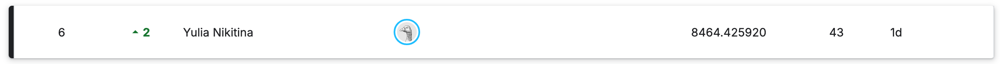

# Intro


#### 1. Как обработаны данные

Базовая обработка включает:

- пропуски в `avg_reviews` заполнены нулями, так как они соответствуют объектам без отзывов;
- `last_dt` преобразован в числовой признак `days_since_last_review`, для объектов без отзывов используется значение `-1`;
- добавлены географические признаки: направление и расстояние от центра города, расстояния до ключевых POI, ближайшего метро и минимальное расстояние до POI;
- из `name` извлечены простые текстовые признаки: длина, доля заглавных букв, число слов, наличие цифр;
- для `_id` и `host_name` построены OOF target-statistics: `mean`, `median`, `std`, `count`;
- добавлены признаки взаимодействия вокруг отзывов, цены, срока аренды и масштаба хоста: например `total_host_x_avg_reviews`, `sum_x_total_host`, `sum_x_min_days`, `reviews_per_recent_day`, `recent_review_90`.

Все признаки, которые используют `target`, для train считаются по OOF-схеме внутри StratifiedKFold, чтобы объект не получал собственный target в качестве признака.

#### 2. Какой алгоритм выбран

Финальное решение – двухуровневый ансамбль. На первом уровне обучаются разные модели и вспомогательные ветки, а на втором уровне их предсказания объединяет CatBoostRegressor.

В финальный набор входов мета-модели входят:

- базовые регрессоры: `catboost`, `lgbm`, `rf`, `et`;
- регрессоры на расширенном наборе interaction-признаков: `catboost_inter`, `rf_inter`, `et_inter`;
- CatBoost с Huber-loss: `cb_huber_basic`, `cb_huber_inter`;
- вероятности отдельных режимов таргета: `p0`, `p350`, `p365`;
- weighted CatBoost-модели для хвостов таргета: `cb_w_high`, `cb_w_top`, `cb_w_zero_high`;
- lookup-признаки по точному совпадению `_id`: `lookup_id_mean`, `lookup_id_count`, `lookup_id_std`, `lookup_id_matched`;
- lookup-признаки по составному ключу `host_name + location + type_house + sum + min_days`: `lookup_host_listing_mean`, `lookup_host_listing_count`, `lookup_host_listing_std`, `lookup_host_listing_matched`.

Финальные предсказания дополнительно усредняются по нескольким мета-моделям CatBoost с разными random_seed.

#### 3. Особенности обучения

Основная схема разбиения StratifiedKFold по бинам таргета. Это важно, потому что таргет сильно несбалансирован: много нулей и заметный верхний хвост около 300-365.

Для каждой модели первого уровня строятся:

- OOF-предсказания на train;
- усредненные предсказания по фолдам на test.

CatBoost получает категориальные признаки напрямую. Для RandomForest и ExtraTrees категориальные признаки кодируются через OrdinalEncoder.

Отдельно обучаются вероятностные модели для режимов таргета. Они помогают финальной модели учитывать нулевые объекты и верхний хвост.

Lookup-признаки тоже считаются OOF-схемой: для validation-части статистики строятся только по train-части текущего фолда. Для test статистики считаются на каждом фолде и затем усредняются.

#### 4. Как проводилась валидация алгоритма

Валидация построена на OOF-предсказаниях. Сначала оцениваются отдельные модели первого уровня, затем финальная мета-модель обучается и проверяется на OOF-матрице.

Дополнительно проверялись:

- качество отдельных базовых моделей;
- вклад разных групп признаков через permutation importance;
- вклад входов мета-модели через leave-one-out ablation;
- варианты состава финальной мета-матрицы до и после добавления lookup-признаков;
- влияние вероятностных признаков режимов таргета;
- residual diagnostics по диапазонам `target`;
- adversarial validation train/test;
- устойчивость финальной мета-модели при разных random_seed.

Модель стала сильнее после weighted-моделей и lookup-признаков, но все еще стягивает прогнозы к середине. Низкие значения таргета часто завышаются, а верхний хвост 300+ недооценивается.


### Содержание

- [Data EDA](#data-eda)
- [Modeling Pipeline](#modeling-pipeline)
  - [Контекст экспериментов и отклоненные идеи](#контекст-экспериментов-и-отклоненные-идеи)
  - [1. Target Binning for Stratified CV](#1-target-binning-for-stratified-cv)
  - [2. Feature Engineering](#2-feature-engineering)
    - [2.1 `activity_features` (date and activity features)](#21-activity_features-date-and-activity-features)
    - [2.2 `geo_features` (bearing degree, distance to city center, poi, metro)](#22-geo_features-bearing-degree-distance-to-city-center-poi-metro)
    - [2.3 `name_features` (len, caps_share, word_count, digits)](#23-name_features-len-caps_share-word_count-digits)
    - [2.4 `id_host_features` (host_name / ID target statistics oof)](#24-id_host_features-host_name--id-target-statistics-oof)
    - [2.5 `interaction_features` (activity / review / host)](#25-interaction_features-activity--review--host)
    - [2.6 Full feature lists](#26-full-feature-lists)
    - [2.7 Adversarial validation](#27-adversarial-validation)
    - [2.8 Permutation importance (CatBoost)](#28-permutation-importance-catboost)
  - [3. Model Training Functions](#3-model-training-functions)
  - [4. Base Models](#4-base-models)
    - [4.1 CatBoost RMSE](#41-catboost-rmse)
    - [4.2 LightGBM](#42-lightgbm)
    - [4.3 RandomForest](#43-randomforest)
    - [4.4 ExtraTrees](#44-extratrees)
    - [4.5 Alternative-Loss CatBoost Model](#45-alternative-loss-catboost-model)
  - [5. Target Mode Classifiers](#5-target-mode-classifiers)
  - [6. Weighted CB](#6-weighted-cb)
  - [8. Stacking](#8-stacking)
    - [8.1 Basic meta-model](#81-basic-meta-model)
    - [8.2 Meta Input Selection](#82-meta-input-selection)
    - [8.3 Lookup Features](#83-lookup-features)
    - [8.4 Final Meta-model tuning](#84-final-meta-model-tuning)
    - [8.5 Seed Ensemble for Meta-Model](#85-seed-ensemble-for-meta-model)
  - [9. Residual Diagnostics](#9-residual-diagnostics)
- [Outro: идеи для дальнейшего улучшения](#outro-идеи-для-дальнейшего-улучшения)


---

In [ ]:
import math
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import plotly.express as px

from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import mean_squared_error, roc_auc_score
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor

from catboost import CatBoostRegressor, CatBoostClassifier
from lightgbm import LGBMRegressor, early_stopping

#### Graphics settings

In [2]:
plt.style.use('seaborn-v0_8-whitegrid')
%config InlineBackend.figure_format = 'retina'

box="#FF6A6A"
dimred="#D31111"
textcolor="#333333"
bgrcolor="#FAFAFA"
sage="#8FAFA9"

In [3]:
plt.rcParams.update({
    "figure.figsize": (8, 4),
    "figure.dpi": 100,

    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "DejaVu Sans", "Avenir Next", "Helvetica Neue",],

    "font.size": 11,
    "axes.titlesize": 16,
    "axes.titleweight": "bold",
    "axes.titlecolor": "#949494",
    "axes.titlepad": 20,
    "axes.labelsize": 12,
    "axes.labelpad": 15,

    "xtick.labelsize": 10,
    "ytick.labelsize": 10,

    "axes.prop_cycle": plt.cycler(color=["#FF6A6A"]),

    "figure.facecolor": "#FAFAFA",
    "axes.facecolor": "#FAFAFA",

    "axes.edgecolor": "#7B7B7B",
    "axes.linewidth": 1,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.spines.left": True,
    "axes.spines.bottom": True,

    "axes.grid": True,
    "grid.color": "#c8c8c8",
    "grid.linestyle": "-",
    "grid.linewidth": 0.7,
    "grid.alpha": 0.3,

    "xtick.color": "#333333",
    "ytick.color": "#333333",
    "xtick.major.pad": 5,
    "ytick.major.pad": 5,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "xtick.major.size": 2,
    "ytick.major.size": 2,
    "xtick.minor.size": 0,
    "ytick.minor.size": 0,
    "xtick.direction": "out",
    "ytick.direction": "out",

    "patch.edgecolor": "white",
    "patch.linewidth": 0.8,
    "patch.facecolor": "#FF6A6A",
})

In [ ]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.image as mpimg
import numpy as np


def add_watermark(
    fig=None,
    logo_path="utils/logo.png",
    title="MTS Teta 2026",
    subtitle="Airbnb Occupancy Prediction Challenge",
    zoom=0.05,
    alpha=0.4,
):
    if fig is None:
        fig = plt.gcf()

    fig_w_px = fig.get_figwidth() * fig.dpi
    fig_h_px = fig.get_figheight() * fig.dpi

    logo = mpimg.imread(logo_path)
    imagebox = OffsetImage(logo, zoom=zoom, alpha=alpha)

    ab = AnnotationBbox(imagebox, (8/fig_w_px, 1 - 8/fig_h_px),
        xycoords=fig.transFigure,
        frameon=False, box_alignment=(0, 1), pad=0,
    )

    fig.add_artist(ab)

    fig.text(50/fig_w_px, 1 - 10/fig_h_px, title, ha="left", va="top",
        fontsize=12, fontweight="bold", color=box, alpha=0.8,)

    fig.text(50/fig_w_px, 1 - 30/fig_h_px, subtitle, ha="left", va="top",
        fontsize=8, color="#949494", alpha=0.65,)


# Data EDA

### Data load

In [4]:
df_train = pd.read_csv('data/train.csv')
df_test = pd.read_csv('data/test.csv')

df_train_original = df_train.copy()
df_test_original = df_test.copy()

In [5]:
df_train.sample(2)

,name,_id,host_name,location_cluster,location,lat,lon,type_house,sum,min_days,amt_reviews,last_dt,avg_reviews,total_host,target
3821,Room Overlooking Hudson River in a Big Apartment,57123462,Sava,Manhattan,Harlem,40.82717,-73.95249,Private room,57,5,4,2017-05-24,0.11,1,0
24730,Bedroom in Beautiful House with Sunny Porch,16686426,Helen,Queens,Long Island City,40.75982,-73.93138,Private room,65,2,10,2019-05-18,0.52,1,0


In [6]:
df_test.sample(2)

,name,_id,host_name,location_cluster,location,lat,lon,type_house,sum,min_days,amt_reviews,last_dt,avg_reviews,total_host
10104,Cozy One Bedroom Near Fort Tryon Park,15197019,Kate,Manhattan,Inwood,40.86082,-73.92585,Entire home/apt,95,2,2,2016-08-15,0.06,1
12141,Sunny and Spacious Brooklyn Apt,25037051,Ruth,Brooklyn,Crown Heights,40.67006,-73.95530,Private room,70,1,10,2017-01-02,0.18,2


### EDA

#### Сравнение распределений признаков в train и test выборках

In [7]:
# таблица для попарного сравнения характеристик train и test
percentiles = [0.01, 0.5, 0.95, 0.99]

train_desc = df_train.describe(percentiles=percentiles)
test_desc = df_test.describe(percentiles=percentiles)

rows = []

for stat in train_desc.index:
    # train строка
    row_train = train_desc.loc[stat].copy()
    row_train.name = f"train_{stat}"
    rows.append(row_train)
    
    # test строка
    row_test = test_desc.loc[stat].copy()
    row_test.name = f"test_{stat}"
    rows.append(row_test)

display(pd.DataFrame(rows))

,_id,lat,lon,sum,min_days,amt_reviews,avg_reviews,total_host,target
train_count,3.667100e+04,36671.000000,36671.000000,36671.000000,36671.000000,36671.000000,29169.000000,36671.000000,36671.000000
test_count,1.222400e+04,12224.000000,12224.000000,12224.000000,12224.000000,12224.000000,9674.000000,12224.000000,NaN
train_mean,6.720433e+07,40.729080,-73.951958,152.142292,7.053176,23.433667,1.365601,7.047694,112.766628
test_mean,6.886703e+07,40.728555,-73.952806,154.455825,6.960324,22.796875,1.396199,7.432837,NaN
train_std,7.828147e+07,0.054671,0.046201,239.107973,21.539569,44.703590,1.643966,32.595427,131.583284
test_std,7.958145e+07,0.054105,0.046020,243.267298,17.055669,44.086754,1.785811,34.001000,NaN
train_min,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
test_min,2.787000e+03,40.506410,-74.239140,0.000000,1.000000,0.000000,0.010000,1.000000,NaN
train_1%,1.041630e+05,40.596763,-74.026190,30.000000,1.000000,0.000000,0.020000,1.000000,0.000000
test_1%,8.869361e+04,40.596275,-74.027591,30.000000,1.000000,0.000000,0.020000,1.000000,NaN


Распределения числовых признаков в train и test в целом похожи по центральной части распределенения до 95-99%. Но есть необычные значения в хвостах распределений:

- `sum`: 99% = 760/800, но max=~10000. Похоже на заглушку "жилье не сдается". 
- `min_days`: 99% = 45 в обеих выборках, но max (train) = 1250 при max (test) = 365. Модель будет обучаться на признаках, которых нет в тестовых данных.
- `avg_reviews`: максимальные значения train ~21, test ~58.5, то есть в тестовых данных есть такие значения, которых нет в обучающей выборке.
- `amt_reviews`: очень длинный хвост распределения, 99% = ~211-214, при максимуме 629/607 и при медианном значении ~5 в обеих выборках.
- `total_host`: медиана ~1, при этом максимальное значение 327. В совокупности с перекосом в amt_reviews можно предположить, что это это гостиницы или бизнес-аккаунты.
- `target`: 99%=365 и max=365, это ceiling значение.

In [8]:
target = df_train['target']      # количество дней, когда жилье было занято за год

cat_cols = [
    'location_cluster',  # кластер местоположения
    'location',          # описание местоположения объекта
    'type_house'         # тип жилья
]

num_cols = [
    'sum',               # (price per night)? общая стоимость аренды или сумма за определенный период.
    'min_days',          # минимальное количество дней для бронирования объекта.
    'amt_reviews',       # количество отзывов, оставленных для данного объекта.
    'avg_reviews',       # средний рейтинг или среднее количество отзывов за определенный период.
    'total_host'         # общее количество объектов, принадлежащих одному хосту
]

date_cols = [
    'last_dt'            # дата последнего отзыва или последнего бронирования.
]

id_cols = [
    '_id',               # уникальный идентификатор
    'name',              # название объекта
    'host_name'          # имя владельца или хоста, который предоставляет жилье
]

geo_cols = [
    'lat',               # широта и долгота местоположения объекта.
    'lon'
]

##### Проверка пропусков в данных

In [9]:
# признаки с пропусками - train
df_train.isna().sum()[df_train.isna().sum() > 0].sort_values(ascending=False)

last_dt        7502
avg_reviews    7502
host_name        18
name              9
dtype: int64

In [10]:
# признаки с пропусками - test
df_test.isna().sum()[df_test.isna().sum() > 0].sort_values(ascending=False)

last_dt        2550
avg_reviews    2550
name              7
host_name         3
dtype: int64

In [11]:
# совпадают ли пропуски в avg_reviews и last_dt в train?
print("Пропуски в avg_reviews и last_dt совпадают в train:",
      (df_train['avg_reviews'].isna() == df_train['last_dt'].isna()).all())

display(pd.crosstab(
    df_train['last_dt'].isna(),
    df_train['avg_reviews'].isna()
))

# в test
print("Пропуски в avg_reviews и last_dt совпадают в test:",
      (df_test['avg_reviews'].isna() == df_test['last_dt'].isna()).all())

display(pd.crosstab(
    df_test['last_dt'].isna(),
    df_test['avg_reviews'].isna()
))

Пропуски в avg_reviews и last_dt совпадают в train: True


avg_reviews,False,True
last_dt,,
False,29169,0
True,0,7502


Пропуски в avg_reviews и last_dt совпадают в test: True


avg_reviews,False,True
last_dt,,
False,9674,0
True,0,2550


- Пропуски в 'avg_reviews' и 'last_dt' полностью совпадают, значит у ряда объектов нет отзывов и, соответственно, даты последнего отзыва. 
- временной признак 'last_dt' можно преобразовать в числовой признак 'days_since_last_review'.

---

#### Таргет

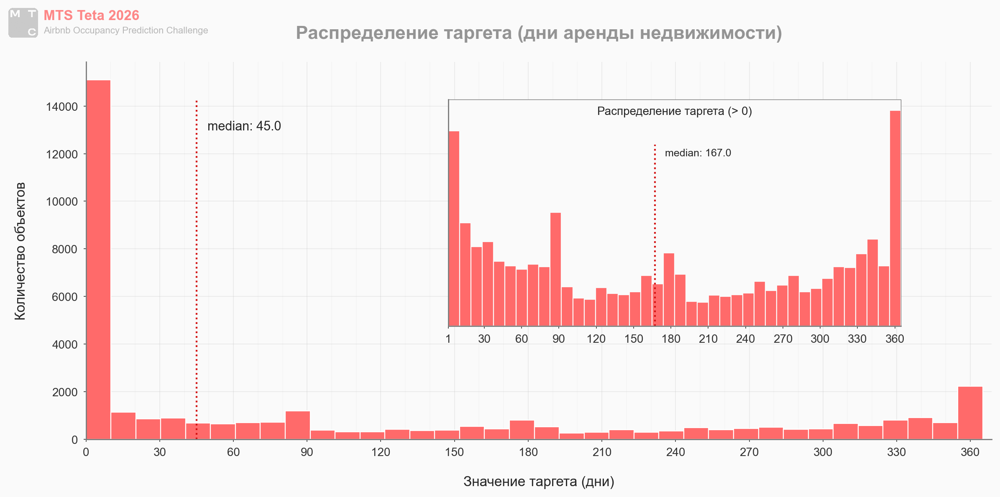

In [279]:
fig, ax = plt.subplots(figsize=(12, 6))

# гистограмма
df_train['target'].hist(bins=36, ax=ax, color=box, edgecolor='white')

# медиана
median = df_train['target'].median()
ax.axvline(median, color=dimred, linestyle=':', lw=1.5, ymax=0.9,)
ax.text(median*1.1, 13000, f'median: {median}')

# тики
ax.set_xticks(np.arange(0, 366, 30))
ax.set_xticks(np.arange(0, 366, 10), minor=True)
ax.grid(which='major', axis='x', alpha=0.3)
ax.grid(which='minor', axis='x', alpha=0.1)

# настройки гистограммы
ax.set_xlim(0, df_train['target'].max()*1.01)
ax.set_title("Распределение таргета (дни аренды недвижимости)")
ax.set_xlabel("Значение таргета (дни)")
ax.set_ylabel("Количество объектов")

# ZOOM: распределение без нулей

axins = ax.inset_axes([0.40, 0.30, 0.5, 0.6])

target_nozeros = df_train['target'][df_train['target'] > 0]

target_nozeros.hist(bins=40, ax=axins, color=box, edgecolor=bgrcolor)

# zoom: медиана
median_z = target_nozeros.median()
axins.axvline(median_z, color=dimred, linestyle=':', lw=1.5, ymax=0.8,)
axins.text(median_z*1.05, axins.get_ylim()[1]*0.75, f'median: {median_z}', fontsize=9)

# zoom: настройки области
axins.text(0.5, 0.97,
    f"Распределение таргета (> 0)",
    transform=axins.transAxes,
    ha='center', va='top', fontsize=10)

axins.set_xlim(1, 365) 
axins.set_xticks(np.insert(np.arange(30, 366, 30), 0, 1))

axins.set_yticks([])
axins.grid(False)

axins.patch.set_facecolor(bgrcolor)
axins.patch.set_alpha(1)
axins.patch.set_edgecolor("#777777")
axins.patch.set_linewidth(0.5)

add_watermark(fig)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

Распределение таргета сильно асимметричное с большим количеством нулевых значений, которые тянут медиану влево (median 45). Есть так же отдельный заметный кластер значений, близких к максимальному (365 дней). 
Возможно много нулевых значений – это новые объекты в базе, или которые по какой-то причине не сдаются большую часть года (например доступны только когда сами хозяева выезжают из этого жилья на каникулы). 

При этом центральная часть распределения (без учета объектов c нулевым значением таргета) выглядит более равномерной в широком диапазоне, медиана в этой части (median 167) заметно выше, то есть наличие большого количества нулей существенно смещает медиану всего распределения. 

Возможно на таргет влияют две разные ситуации – часть жилья доступна для аренды в нормальном режиме, и другая часть – только временно или по факту не доступна, хотя и значится в базе.

---

#### Даты

In [13]:
# преобразование last_dt в datetime с обработкой ошибок
df_train['last_dt'] = pd.to_datetime(df_train['last_dt'], errors='coerce')
df_test['last_dt'] = pd.to_datetime(df_test['last_dt'], errors='coerce')

In [14]:
# дата самого последнего отзыва
max_date = df_train['last_dt'].max()

# новый признак для давности последнего отзыва
df_train['days_since_last_review'] = (max_date - df_train['last_dt']).dt.days
df_test['days_since_last_review'] = (max_date - df_test['last_dt']).dt.days

# заполнение пропусков в days_since_last_review значением -1, чтобы не смешивать с реальными 0
df_train['days_since_last_review'] = df_train['days_since_last_review'].fillna(-1)
df_test['days_since_last_review'] = df_test['days_since_last_review'].fillna(-1)

# удаление столбца last_dt, так как он больше не нужен  
df_train.drop(columns='last_dt', inplace=True)
df_test.drop(columns='last_dt', inplace=True)

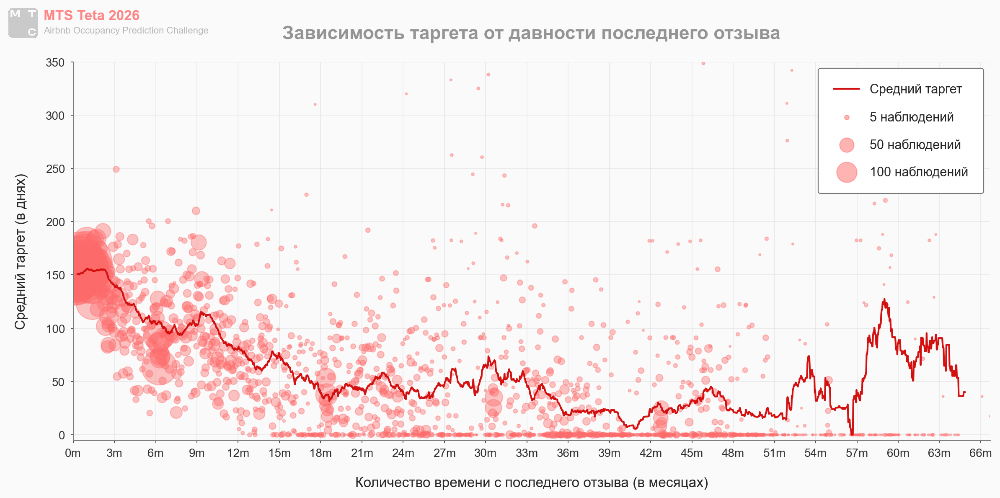

In [280]:
fig, ax = plt.subplots(figsize=(12, 6))

grouped = (df_train[df_train['days_since_last_review'] != -1]
    .groupby('days_since_last_review')['target'].agg(['mean', 'count']))

# полный диапазон дней
days_range = range(int(grouped.index.min()), int(grouped.index.max()) + 1)
grouped_full = grouped.reindex(days_range)

# сглаживание
smooth = grouped_full['mean'].rolling(50, min_periods=10).mean()

# линия
ax.plot(smooth, color=dimred, linewidth=1.5, label="Средний таргет")

# точки по агрегатам
ax.scatter(
    grouped.index,
    grouped['mean'],
    s=grouped['count']*3,   
    alpha=0.4,
    color=box,
)

# легенда для scatter
for size in [5, 50, 100]:
    ax.scatter([], [], s=size*3, color=box, alpha=0.5,
               label=f'{size} наблюдений')

ax.legend(loc='upper right',
    frameon=True, facecolor='white', framealpha=1,
    edgecolor='#777777', borderpad=1.2,
    labelspacing=1.2)

# месяцы на оси Х
ticks = np.arange(0, 2001, 90)
labels = [f"{int(x/30)}m" for x in ticks]

ax.set_xticks(ticks)
ax.set_xticklabels(f"{int(x/30)}m" for x in ticks)

ax.set_xlim(0, 2000)
ax.set_ylim(-5, 350)

ax.set_title("Зависимость таргета от давности последнего отзыва")
ax.set_xlabel("Количество времени с последнего отзыва (в месяцах)")
ax.set_ylabel("Средний таргет (в днях)")

add_watermark(fig)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

В пределах 1-1.5 лет со дня последнего отзыва есть определенная взаимосвязь давности отзыва и таргета: объекты с недавней активностью лучше сдаются. Похоже что отзывы в пределах 2 месяцев влияют одинаково – средняя линия держится на уровне около 150-160 (это близко к медиане таргета без учета нулевых значений = 167). Дальше идет довольно плавный спад, но в пределах 12 месяцев практически нет нулевых значений таргета. То есть если объект действительно сдается, то его снимают. После давности отзыва 12 месяцев есть наблюдения с разными значениями таргета, в том числе большими (долгосрочная аренда), но выделяется отдельный кластер объектов с нулевым таргетом, лежащих на оси Х. Вероятно именно эти объекты создают большой пик распределения в 0, то есть они есть в базе, но по факту не сдаются.

---

#### Числовые признаки

In [16]:
num_cols

['sum', 'min_days', 'amt_reviews', 'avg_reviews', 'total_host']

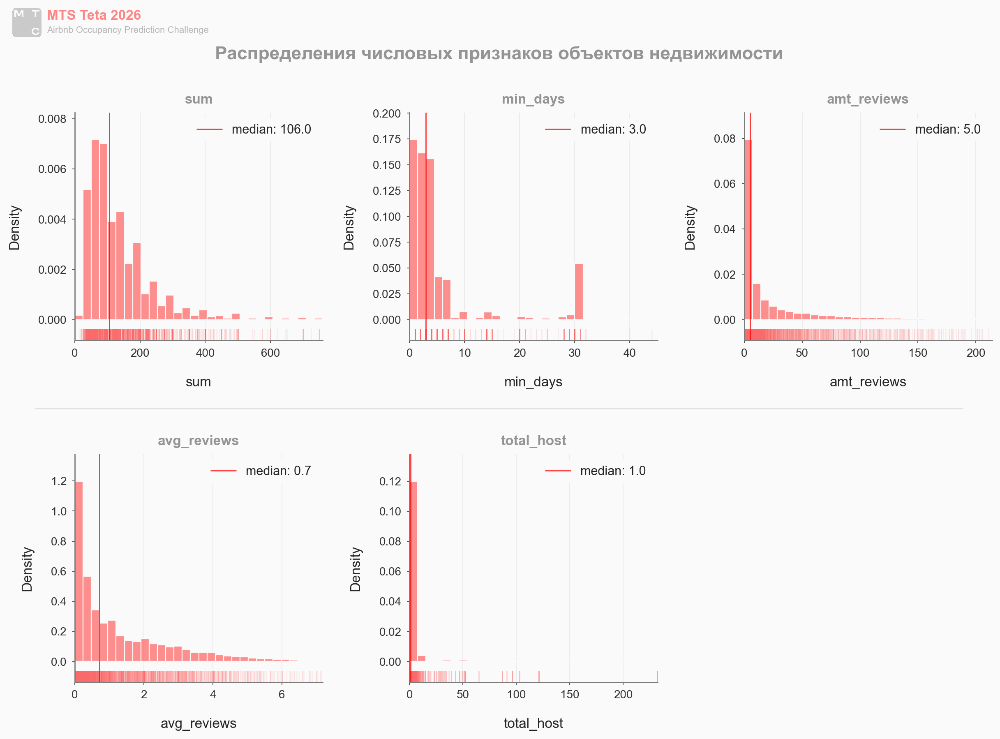

In [383]:
from matplotlib.lines import Line2D

fig, axes = plt.subplots(2, 3, figsize=(12, 9))

for i, col in enumerate(num_cols):
    ax = axes.flatten()[i]

    q99 = df_train[col].quantile(0.99)

    x_rug = df_train[col].sample(min(len(df_train[col]), 3000), random_state=42)
    sns.rugplot(x_rug, height=0.05, alpha=0.1, color=box,
        linewidth=1, clip_on=True, ax=ax)
    
    sns.histplot(df_train[col], stat='density', 
        bins=30, binrange=(0, q99), ax=ax,
        edgecolor=bgrcolor, linewidth=0.8)
    
    ymin, ymax = ax.get_ylim()
    ax.set_ylim(-ymax * 0.1, ymax)
    ax.set_xlim(0, q99)

    median = df_train[col].median()
    ax.axvline(median, color='red', lw=1, alpha=0.8,
               label=f"median: {median:.1f}")

    ax.set_title(col, fontsize=12, pad=8)
    ax.grid(axis='y', visible=False)
    ax.legend(frameon=True, facecolor=bgrcolor, edgecolor=bgrcolor, framealpha=1,)

for j in range(len(num_cols), 6):
    axes.flatten()[j].axis('off')

fig.suptitle("Распределения числовых признаков объектов недвижимости",
    fontsize=16, fontweight="bold", color='#949494', y=0.94)

fig.add_artist(Line2D([0.03, 0.97], [0.45, 0.45],
    transform=fig.transFigure, color="#D8D8D8", lw=1, alpha=0.8,))

add_watermark(fig)
fig.subplots_adjust(left=0.07, right=1, bottom=0.08, top=0.85,
    hspace=0.50, wspace=0.35,)
plt.show()


- sum: большинство значений в диапазоне ~25–200, распределение с длинным правым хвостом. Есть редкие выбросы высоких значений.

- min_days: в основном 1–5 дней, распределение сильно скошено вправо. Отдельный пик на 30 дней (помесячная аренда).

- amt_reviews: много объектов с небольшим количеством отзывов, распределение с длинным хвостом. Есть отдельные объекты с очень большим числом отзывов.

- avg_reviews: большинство значений низкие (до ~2), распределение правосторонне асимметричное. Более высокие значения встречаются редко.

- total_host: у большинства хостов мало объектов, распределение сильно скошено вправо. Есть небольшое количество хостов с большим числом объектов.

**Связь стоимости аренды и количества дней аренды:**

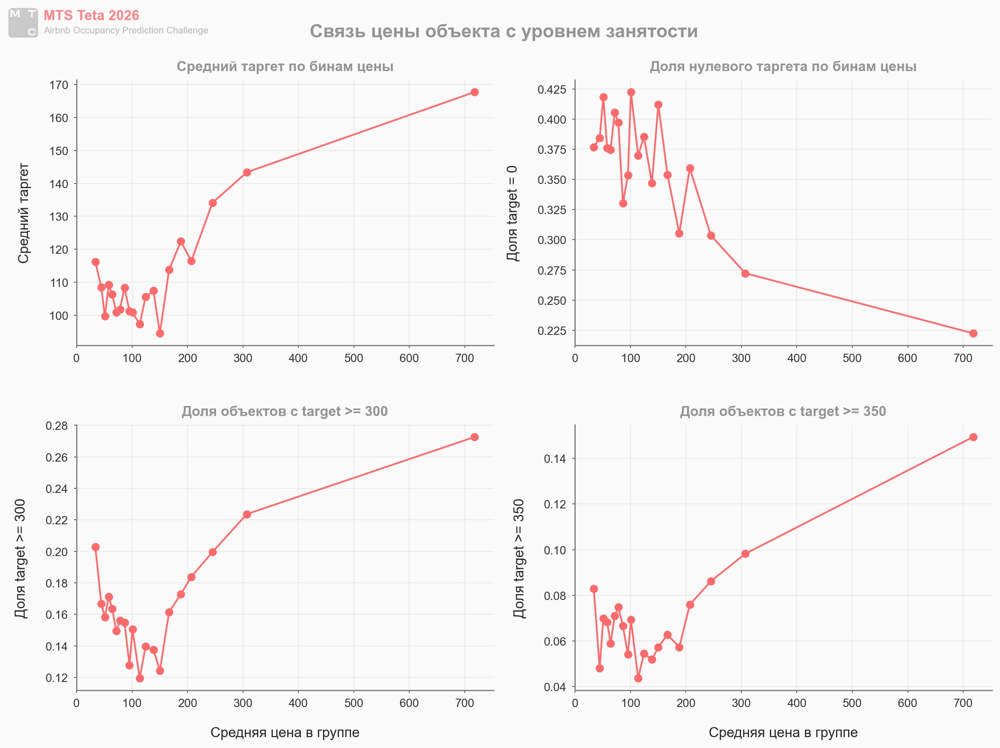

In [384]:
plot_df = df_train[['sum', 'target']].dropna().copy()

# Делим объекты на 20 бинов по цене.
# rank(method='first') делает значения уникальными по порядку строк,
# поэтому pd.qcut стабильно разбивает даже при большом числе одинаковых цен.
# В каждом бине будет примерно одинаковое количество объектов.
plot_df['sum_bin'] = pd.qcut(
    plot_df['sum'].rank(method='first'), 20, labels=False
)

# агрекаты для ценовых групп
sum_profile = (
    plot_df
    .groupby('sum_bin')
    .agg(
        n=('target', 'size'),
        sum_min=('sum', 'min'),
        sum_max=('sum', 'max'),
        sum_mean=('sum', 'mean'),
        target_mean=('target', 'mean'),
        target_median=('target', 'median'),
        zero_share=('target', lambda s: (s == 0).mean()),
        top300_share=('target', lambda s: (s >= 300).mean()),
        top350_share=('target', lambda s: (s >= 350).mean()),
    )
)

fig, axes = plt.subplots(2, 2, figsize=(12, 9), sharex=False)

x = sum_profile['sum_mean']

# 1: как меняется средний target в зависимости от ценовой группы
axes[0, 0].plot(x, sum_profile['target_mean'], marker='o')
axes[0, 0].set_title('Средний таргет по бинам цены', fontsize=12, pad=8)
axes[0, 0].set_ylabel('Средний таргет')

# 2: как меняется доля объектов с target = 0
axes[0, 1].plot(x, sum_profile['zero_share'], marker='o')
axes[0, 1].set_title('Доля нулевого таргета по бинам цены', fontsize=12, pad=8)
axes[0, 1].set_ylabel('Доля target = 0')

# 3: как меняется доля объектов с target >= 300
axes[1, 0].plot(x, sum_profile['top300_share'], marker='o')
axes[1, 0].set_title('Доля объектов с target >= 300', fontsize=12, pad=8)
axes[1, 0].set_ylabel('Доля target >= 300')
axes[1, 0].set_xlabel('Средняя цена в группе')

# : как меняется доля объектов с target >= 350
axes[1, 1].plot(x, sum_profile['top350_share'], marker='o')
axes[1, 1].set_title('Доля объектов с target >= 350', fontsize=12, pad=8)
axes[1, 1].set_ylabel('Доля target >= 350')
axes[1, 1].set_xlabel('Средняя цена в группе')

fig.suptitle("Связь цены объекта с уровнем занятости",
    fontsize=16, fontweight="bold", color="#949494", y=0.97,)


add_watermark(fig)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.subplots_adjust(hspace=0.3)
plt.show()

Цена аренды (_sum_) связана с _target_, но связь нелинейная. На малых и средних значениях цены метрики заметно шумят, устойчивый сигнал появляется в дорогом сегменте.

**Слева сверху**: средний _target_ в дешевых и средних бинах колеблется примерно в диапазоне 95-120. После цены около 170-200 средний _target_ начинает заметно расти и в самых дорогих бинах достигает примерно 165-170.

**Справа сверху**: доля нулевого _target_ в дешевых бинах высокая и нестабильная, примерно 33-42%. Начиная примерно с цены около 180-250, она снижается, а в самых дорогих бинах падает примерно до 22-27%. То есть дорогие объекты реже имеют нулевую занятость.

**Слева снизу**: доля объектов с _target_ >= 300 в дешевых бинах местами достаточно высокая, затем проседает примерно до 12-15%, а после цены около 160-200 начинает устойчиво расти и доходит примерно до _27%_ в самом дорогом сегменте.

**Справа снизу**: доля _target_ >= 350 в дешевых и средних бинах  в основном держится около 5-8%, а после _sum_mean_ около 180-200 растет и достигает примерно 15% в самом дорогом бине.

Вывод: высокая стоимость повышает ожидаемый target и снижает шанс нуля, но сама по себе не может надежно определить объекты с высокой занятостью (300+ или 350+).

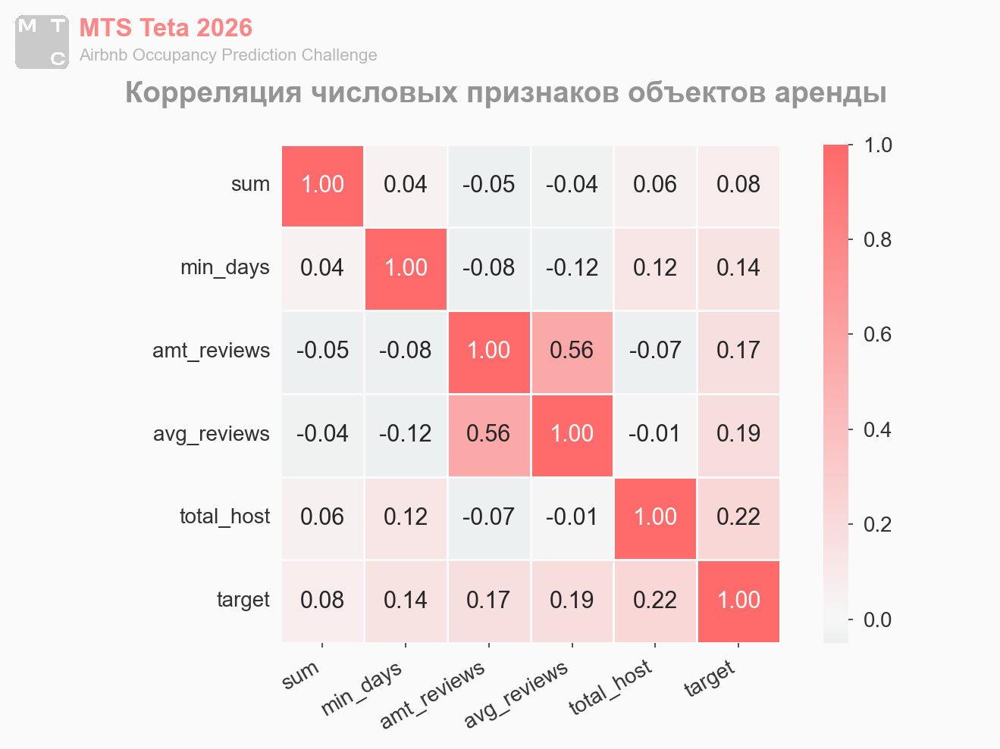

In [391]:
corr_cmap = LinearSegmentedColormap.from_list(
    "coral_sage",
    ["#2F6F64", "#F7F7F7", "#FF6A6A"],
)

corr = df_train[num_cols + ['target']].corr()

fig, ax = plt.subplots(figsize=(7, 5))

ax = sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap=corr_cmap,
    center=0,
    vmin=-0.05,
    vmax=1,
    linewidths=1,
    linecolor="#FAFAFA",
    square=True,
)

ax.tick_params(axis='y', length=0)
plt.xticks(rotation=30, ha='right')
ax.set_title("      Корреляция числовых признаков объектов аренды            ", fontsize=14)

add_watermark(fig)
plt.tight_layout(rect=[0, 0, 0.92, 0.93])
plt.show()


Линейные корреляции числовых признаков с _target_ слабые: максимум около 0.22 у _total_host_. Ни один отдельный числовой признак не объясняет таргет линейно. Признаки активности отзывов (_amt_reviews_, _avg_reviews_) заметно связаны между собой (0.56), поэтому их вклад в моделях может частично дублироваться.

- _sum_: практически не связан с другими признаками и таргетом (корреляции близки к нулю). 
- _min_days_: слабая положительная связь с таргетом (~0.14). Также немного связан с total_host, влияние слабое.
- _amt_reviews_: умеренная связь с avg_reviews (~0.56), что логично — признаки частично отражают одно и то же. С таргетом связь слабая (~0.17).
- _avg_reviews_: слабая положительная связь с таргетом (~0.19). Один из более информативных признаков, но эффект не большой.
- _total_host_: самая высокая корреляция с таргетом (~0.22) среди всех признаков.
- _target_: ни с одним признаком нет сильной линейной зависимости. Все корреляции слабые (<0.25), возможна нелинейность или влияние комбинаций признаков.

----

#### Категориальные признаки

In [20]:
cat_cols

['location_cluster', 'location', 'type_house']

##### 1. 'location_cluster'

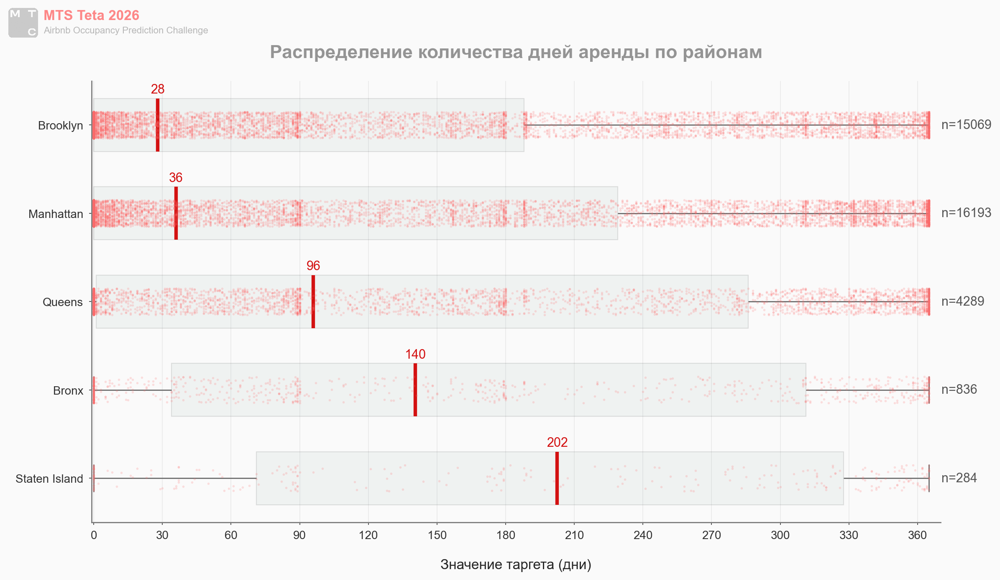

In [377]:
fig, ax = plt.subplots(figsize=(12, 7))

# порядок кластеров по медиане
order = (df_train.groupby('location_cluster')['target']
    .median().sort_values().index)

# boxplot
sns.boxplot(data=df_train,
    y='location_cluster', x='target', order=order,
    width=0.6, ax=ax,
    medianprops=dict(color=dimred, linewidth=3),
    boxprops=dict(facecolor="#8FAFA9", edgecolor='black', alpha=0.1, linewidth=0.8),
    whiskerprops=dict(linewidth=1),
    capprops=dict(linewidth=1)
)

# stripplot
sample_idx = (
    df_train
    .groupby('location_cluster')
    .apply(lambda g: g.sample(min(len(g), 10000), random_state=42).index)
    .explode()
)

strip_df = df_train.loc[sample_idx].copy()

sns.stripplot(data=strip_df, x='target', y='location_cluster',
    order=order, color=box, jitter=0.15, alpha=0.2, size=2, ax=ax,)

# медианы
medians = (df_train.groupby('location_cluster')['target']
    .median().reindex(order))

for i, val in enumerate(medians):
    ax.text(val, i - 0.40,
        f"{val:.0f}", va='center', ha='center',
        fontsize=11, color=dimred)

# количество объектов
counts = df_train['location_cluster'].value_counts().reindex(order)

x_max = 365

for i, cat in enumerate(order):
    ax.text(x_max * 1.015, i,
        f"n={counts[cat]}", va='center',
        fontsize=11, color='#555555')

ax.set_xticks( np.arange(0, 366, 30))

# оформление
ax.set_xlim(-1, 370)
ax.set_title("Распределение количества дней аренды по районам")
ax.set_xlabel("Значение таргета (дни)")
ax.set_ylabel("")
ax.grid(axis='y', visible=False)

add_watermark(fig)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Во всех районах распределения таргета похожи – широкий разброс значений во всем диапазоне. Внутри каждого района распределение таргета выглядит достаточно равномерно. Чуть больше наблюдений в хвостах распределений чем в середине, но это консистентно между кластерами локаций. Есть отдельные уплотнения в виде вертикальных скоплений точек в одних и тех же местах на уровне например 3 месяца, 6 месяцев, но этот паттерн так же одинаков по всем районам. 

Основное различие между районами – в количестве объектов. Категории кластеров представлены неравномерно, Бруклин и Манхеттен содержат больше 15000 объектов каждый, а Бронкс и Стейтен-Айленд всего 836 и 284 соответственно.

In [22]:
train_dist = df_train['location_cluster'].value_counts(normalize=True)
test_dist = df_test['location_cluster'].value_counts(normalize=True)

pd.concat([train_dist, test_dist], axis=1, keys=['train', 'test']).round(3)

,train,test
location_cluster,,
Manhattan,0.442,0.447
Brooklyn,0.411,0.412
Queens,0.117,0.113
Bronx,0.023,0.021
Staten Island,0.008,0.007


Распределение 'location_cluster' в train и test совпадает. Этот признак дублирует географическую информацию (latitude, longitude).

##### 2. 'location'

In [23]:
df_train.groupby('location_cluster')['location'].nunique()

location_cluster
Bronx            48
Brooklyn         47
Manhattan        32
Queens           51
Staten Island    42
Name: location, dtype: int64

Распределение location по районам города примерно равномерное.

In [24]:
display(df_train['location'].value_counts().head(10))
print(". . . ")
display(df_train['location'].value_counts().tail(10))

location
Williamsburg          2964
Bedford-Stuyvesant    2755
Harlem                2002
Bushwick              1865
Upper West Side       1498
Hell's Kitchen        1488
East Village          1373
Upper East Side       1319
Crown Heights         1178
Midtown               1146
Name: count, dtype: int64

. . . 


location
Grant City                    2
Bay Terrace, Staten Island    2
Breezy Point                  2
Fort Wadsworth                1
Westerleigh                   1
Woodrow                       1
Willowbrook                   1
New Dorp                      1
Howland Hook                  1
Rossville                     1
Name: count, dtype: int64

Количество объектов недвижимости в каждой локации очень неравномерное, варьируется от ~3000 до 1. 

In [25]:
print(f"Всего уникальных location: {df_train['location'].nunique()}")
print(f"location присутствуют больше чем в одном кластере: {(df_train.groupby('location')['location_cluster'].nunique() > 1).sum()}")

Всего уникальных location: 220
location присутствуют больше чем в одном кластере: 0


location_cluster агрегирует location в группы, т.е. location это мелкая детализация внутри района.

##### 3. 'type_house'

In [26]:
train_dist = df_train['type_house'].value_counts(normalize=True)
test_dist = df_test['type_house'].value_counts(normalize=True)

pd.concat([train_dist, test_dist], axis=1, keys=['train', 'test']).round(3)

,train,test
type_house,,
Entire home/apt,0.518,0.523
Private room,0.458,0.453
Shared room,0.024,0.023


Распределение 'type_house' в train и test совпадает, сдвига распределения в этих выборках нет. Доля shared_room всего ~2%, категории представлены неравномерно.

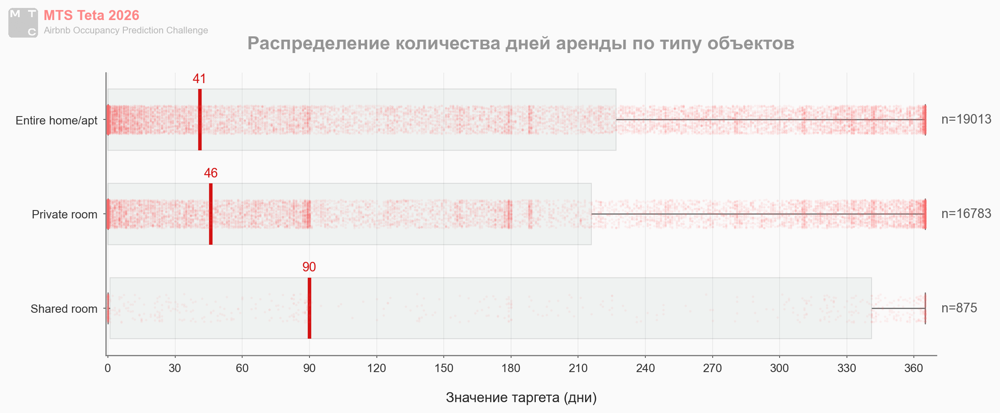

In [378]:
fig, ax = plt.subplots(figsize=(12, 5))

# порядок категорий
order = df_train['type_house'].value_counts().index

# boxplot
sns.boxplot(data=df_train, y='type_house', x='target',
    order=order, width=0.65, ax=ax, 
    medianprops=dict(color=dimred, linewidth=3, alpha=1), 
    boxprops=dict(facecolor=sage, edgecolor='black', alpha=0.1, linewidth=0.8),
    whiskerprops=dict(linewidth=1),
    capprops=dict(linewidth=1)
    )

# stripplot
sns.stripplot(data=df_train,
    x='target', y='type_house',
    order=order, color=box, jitter=0.15,
    alpha=0.08, size=2, ax=ax)

# медианы
medians = df_train.groupby('type_house')['target'].median().reindex(order)

for i, val in enumerate(medians):
    ax.text(val, i-0.43, f"{val:.0f}",
        va='center', ha='center',
        fontsize=11, color=dimred)

# количество наблюдений
counts = df_train['type_house'].value_counts().reindex(order)
x_max = 365

for i, cat in enumerate(order):
    ax.text(x_max * 1.02, i,
        f"n={counts[cat]}",
        va='center', fontsize=11,
        color='#555555')
    
ax.set_xticks( np.arange(0, 366, 30))

# оформление
ax.set_xlim(-1, 370)
ax.set_title("Распределение количества дней аренды по типу объектов")
ax.set_xlabel("Значение таргета (дни)")
ax.set_ylabel("")
ax.grid(axis='y', visible=False)

add_watermark(fig)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Несмотря на более высокую медиану в категории shared_room, учитывая долю наблюдений всего ~2%, выводов о более высокой загрузке этого типа объектов сделать нельзя. По категориям *entire home/apt* и *private room* распределения сильно перекрываются, разброс внутри категорий большой – связь с таргетом слабая. Видны отдельные вертикальные кластеры точек например на значении таргета 3 месяца и 6 месяцев. Распределение таргета по типам объектов имеет примерно похожую структуру, но категории неравномерны по количеству объектов.

----

#### Гео признаки

In [ ]:
fig = px.scatter_mapbox(
    df_train,
    lat="lat",
    lon="lon",
    color="target",
    hover_name="name",
    hover_data=[
        'sum',
        'min_days',
        'amt_reviews',
        'avg_reviews',
        'total_host',
        'days_since_last_review'
    ],
    zoom=9.5,
    height=700,
    width=700,  
    color_continuous_scale="Viridis",
)

fig.update_layout(mapbox_style="open-street-map")
fig.show()

/var/folders/vj/mjshxlvj4hxdrtj0f2_wfwdw0000gn/T/ipykernel_15207/142389608.py:3: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


<p align="left" style="color: #949494; font-size: 12px;">
  <em>[ Plotly map screenshot ]</em>
</p>

<p align="left">
  <img src="utils/plotly_map.jpg" alt="Plotly map screenshot" width="900">
</p>


Высокие/низкие значения таргета не формирут четких кластеров и рассеяны по всем районам города. Внутри каждого района высокая вариативность таргета.

---

#### ID признаки

In [29]:
id_cols

['_id', 'name', 'host_name']

In [30]:
df_train[['_id', 'name', 'host_name']][:10]

,_id,name,host_name
0,40327248,Belle Harbor 4 BR 2 bath- 1 bl from Beach,Sarina
1,13617520,"Come see Brooklyn, New York",Howard T.
2,26754726,Large 2Br on W71st & Columbus Feb 19-28,Julie
3,16721721,Perfect bedroom. Near Subways Columbia CityCol...,Federico
4,22246463,Cozy Sun Filled Fresh Guest Room in Artsy Bush...,Lisa
5,120643397,Comfortable Duplex Studio with Balcony! Near t...,Rachel
6,88073013,Simple PRIVATE ROOM in UNION SQUARE,Rui
7,9293730,RENOVATED 2 BEDROOM APT NEAR CENTRAL PARK WEST,Inna
8,19529891,"Charming, spacious UES studio",Shilpa
9,88111418,Beautiful garden apartment,Micheline


In [31]:
# анализ ID-признаков

n_train = len(df_train)
n_test = len(df_test)

print("Размер данных")
print(f"train: {n_train}")
print(f"test:  {n_test}\n")

print("Уникальные значения в train")
print(f"_id:       {df_train['_id'].nunique()} ({df_train['_id'].nunique() / n_train:.1%} от train)")
print(f"name:      {df_train['name'].nunique()} ({df_train['name'].nunique() / n_train:.1%} от train)")
print(f"host_name: {df_train['host_name'].nunique()} ({df_train['host_name'].nunique() / n_train:.1%} от train)\n")

print("Пересечение train и test")
print(
    f"_id:       {len(set(df_train['_id']) & set(df_test['_id']))} "
    f"({len(set(df_train['_id']) & set(df_test['_id'])) / df_test['_id'].nunique():.1%} от уникальных _id в test)"
)
print(
    f"name:      {len(set(df_train['name']) & set(df_test['name']))} "
    f"({len(set(df_train['name']) & set(df_test['name'])) / df_test['name'].nunique():.1%} от уникальных name в test)"
)
print(
    f"host_name: {len(set(df_train['host_name']) & set(df_test['host_name']))} "
    f"({len(set(df_train['host_name']) & set(df_test['host_name'])) / df_test['host_name'].nunique():.1%} от уникальных host_name в test)"
)

Размер данных
train: 36671
test:  12224

Уникальные значения в train
_id:       29141 (79.5% от train)
name:      36076 (98.4% от train)
host_name: 9629 (26.3% от train)

Пересечение train и test
_id:       2447 (22.7% от уникальных _id в test)
name:      287 (2.4% от уникальных name в test)
host_name: 2840 (60.9% от уникальных host_name в test)


- **ID**: ~20% значений в train повторяются: одни и те же квартиры встречаются несколько раз, по ним можно понять, как они обычно сдаются.
~23% id из test уже есть в train, их прошлое поведение можно использовать в модели.

- **name**: почти все значения уникальные (~98%), это просто описание объекта, повторений почти нет, поэтому по нему нельзя считать надежные статистики.
Пересечение с test низкое (~2%), name не переносит полезную информацию между выборками.

- **host_name**: только ~26% значений уникальные, одни и те же имена встречаются много раз: можно смотреть, как в среднем ведут себя объекты с таким именем.
При этом пересечение с test очень высокое (~61%), большинство имен из test уже есть в train, эта информация может помочь модели.

In [32]:
print("Повторяемость внутри train\n")

id_counts = df_train['_id'].value_counts()
host_counts = df_train['host_name'].value_counts()

print(f"_id, которые встречаются больше 1 раза: {sum(id_counts > 1)} ({sum(id_counts > 1) / len(id_counts):.1%})")
print(f"строк с повторяющимся _id: {df_train['_id'].isin(id_counts[id_counts > 1].index).mean():.1%}\n")

print(f"host_name, которые встречаются больше 1 раза: {sum(host_counts > 1)} ({sum(host_counts > 1) / len(host_counts):.1%})")
print(f"строк с повторяющимся host_name: {df_train['host_name'].isin(host_counts[host_counts > 1].index).mean():.1%}")

Повторяемость внутри train

_id, которые встречаются больше 1 раза: 3507 (12.0%)
строк с повторяющимся _id: 30.1%

host_name, которые встречаются больше 1 раза: 3668 (38.1%)
строк с повторяющимся host_name: 83.7%


- **_id**: хотя большинство значений уникальны, около 30% строк относятся к повторяющимся объектам. То есть по значительной части данных можно использовать информацию о прошлом поведении. Есть пересечение с test, значит сигнал переносится.

- **host_name**: большинство строк (~84%) связано с повторяющимися именами хостов, и пересечение с train высокое. Почти для всех объектов можно использовать агрегированную информацию по имени.

In [33]:
display(
    df_train.groupby('_id')['target']
    .agg(['count', 'mean', 'median', 'min', 'max', 'std'])
    .sort_values('count', ascending=False)
    .head(10)
)

display(
    df_train.groupby('host_name')['target']
    .agg(['count', 'mean', 'median', 'min', 'max', 'std'])
    .sort_values('count', ascending=False)
    .head(10)
)

,count,mean,median,min,max,std
_id,,,,,,
219517861,238,301.046218,327.0,37,365,66.677019
107434423,176,257.994318,295.5,1,365,95.313168
30283594,79,311.050633,352.0,133,365,75.046977
137358866,78,190.910256,235.0,0,273,91.202954
16098958,68,293.397059,312.0,0,365,73.650676
61391963,68,253.176471,310.0,0,364,100.781712
12243051,68,275.750000,323.5,1,365,94.757881
22541573,65,307.846154,342.0,0,365,84.491721
200380610,45,340.600000,364.0,110,365,48.677230


,count,mean,median,min,max,std
host_name,,,,,,
Michael,308,91.305195,14.5,0,365,123.150358
David,306,107.428105,21.0,0,365,131.419774
Sonder (NYC),238,301.046218,327.0,37,365,66.677019
John,223,139.179372,87.0,0,365,141.218871
Alex,205,115.463415,51.0,0,365,130.219215
Blueground,176,257.994318,295.5,1,365,95.313168
Sarah,165,56.400000,0.0,0,365,94.819585
Jessica,160,108.725000,26.0,0,365,134.432745
Daniel,157,81.426752,0.0,0,365,117.696546


- **id**: внутри одного id значения могут сильно отличаться (есть почти весь диапазон от 0 до 365), но средние значения по разным id различаются заметно. Агрегаты по _id (mean, median) могут дать полезный сигнал несмотря на разброс.

- **host_name**: внутри одного имени разброс еще сильнее, так как под одним именем могут быть разные хосты. Тем не менее средние значения по именам различаются, то есть у разных имен есть свой "типичный уровень". Это более шумный сигнал, чем у _id, но он покрывает большую часть данных и тоже может быть полезен в агрегированном виде.

**Symbols/ emoji**

In [34]:
ignored_name_symbols = {
    '+', '|', '~', '/', '\\',
    '-', '_', '=', '*',
    '&', '@', '#', '%',
    '$', '€', '£', '¥',
    '©', '®', '™',
    '×',
}


In [35]:
import unicodedata

def extract_name_symbols(text):
    symbols = []

    for char in str(text):
        if char in ignored_name_symbols:
            continue

        if unicodedata.category(char).startswith('S'):
            symbols.append(char)

    return symbols


In [36]:
symbols = set()

for name in pd.concat([df_train['name'], df_test['name']]).fillna(''):
    symbols.update(extract_name_symbols(name))

print("Символы в описаниях объектов недвижимости")
print(' '.join(symbols))


Символы в описаниях объектов недвижимости
♪ ` ♥ ✨ ✰ ❤ △ ✤ ✭ ⬆ ⚓ ♦ > ➽ ✮ ◔ ￨ < ➖ ✧ ▲ ✔ ^ √ ✿ ⚡ ❋ ☼ ⋆ ✴ ☀ ⏩ ✌ ⍟ ☞ ⌚ ☯ ♀ ☆ ￫ ♔ ° ⭐ ♡ ☺ ❀ ▶ ♛ ✪ ✦ ☕ ☝ ♕ ➡ ❣ ✺ ⏪ ♂ ⊹ ´ ❥ ★ ⚾ ✩ ◈ ✈ ⚜


In [37]:
# влияет ли наличие emoji в описаниях на таргет?

symbol_target_check = (
    pd.DataFrame({
        'has_symbol': df_train['name'].fillna('').apply(
            lambda x: int(len(extract_name_symbols(x)) > 0)
        ),
        'target': df_train['target'],
    })
    .groupby('has_symbol')['target']
    .agg(['count', 'mean', 'median', 'std'])
    .reset_index()
)

display(symbol_target_check)


,has_symbol,count,mean,median,std
0,0,36317,112.459537,44.0,131.610516
1,1,354,144.271186,126.5,124.983239


В названиях с emoji/символами target заметно выше по mean и median, но таких объектов очень мало, меньше 1%. Поэтому этот признак не был добавлен в финальный feature set по результатам permutation importance проверки.

---

# Modeling Pipeline

## Контекст экспериментов и отклоненные идеи

#### Что дало сильный прирост

- OOF target-statistics по `_id` и `host_name` дали самый сильный прирост относительно базового набора признаков. Особенно важными оказались признаки по `_id`: они хорошо используют повторяемость объектов и хостов между train и test.
- Признаки взаимодействия (interactions) вокруг отзывов, цены, минимального срока аренды и масштаба хоста улучшили отдельные базовые модели. Поэтому в финальном наборе остались отдельные ветки на расширенном наборе признаков: `catboost_inter`, `rf_inter`, `et_inter`.  
- Вероятностные модели для режимов таргета помогают финальной модели лучше учитывать края распределения. В финальном наборе оставлены `p0`, `p350`, `p365`; `p30` был проверен, но после добавления lookup-признаков стал лишним.
- Weighted CatBoost-регрессоры для хвостов таргета заметно улучшили качество. 
- Huber-ветки CatBoost дают дополнительный сигнал, поэтому в финальный набор вошли обе версии: `cb_huber_basic` и `cb_huber_inter`.
- Lookup-признаки по повторяющимся `_id` и составному ключу `host_name + location + type_house + sum + min_days` дали сильный дополнительный сигнал и вошли в финальную мета-модель.
- После добавления lookup-признаков и удаления `p30` все оставшиеся входы финальной мета-модели дают положительный вклад по ablation-проверке.
- Финальная мета-модель — `CatBoostRegressor` на отобранных предсказаниях базовых моделей и lookup-признаках. Она дала лучшее качество по сравнению с другими вариантами (Ridge, LinearRegression, Huber). Результат стабилизируется усреднением нескольких мета-моделей CatBoost с разными random_seed.

#### Что проверено и отклонено

- Режимные признаки (`is_prof_host`, `is_long_stay`, `is_expensive_short_stay`) и их взаимодействия не улучшили CatBoost, поэтому не вошли в финальный пайплайн.
- `CatBoost tweedie` ухудшал качество ансамбля и остался только как проверенная, но не используемая ветка.
- `prob_365` и `prob_top300` были полезны для диагностики, но в финальном наборе стали лишними.
- `catboost_inter` помогал в более раннем варианте ансамбля, но после добавления weighted-моделей начал ухудшать качество.
- `mlp` не дал дополнительной пользы после появления более сильных веток.
- Дополнительная weighted-ветка `et_w_top350` улучшала локальную проверку, но ухудшала результат на Kaggle, поэтому была отклонена как рискованная.
- KNN geo predictor не улучшил ансамбль и был удален из чистого пайплайна.
- Модель на ключевых словах из `name` не дала прироста и была удалена.
- TF-IDF признаки из `name` проверялись, но были отклонены: они усиливали различие между train и test по adversarial validation и не дали надежного улучшения. В финальном пайплайне оставлены только простые признаки из `name`: длина, доля заглавных букв, число слов, наличие цифр.
- Более жесткие варианты lookup-признаков, включая фильтрацию по надежности и применение только к крайним прогнозам, оказались хуже обычной схемы.
- Групповая проверка по `_id` и `host_name` не показала простой утечки данных: качество оставалось близким к обычной проверке. Основная проблема скорее в различии между локальной проверкой и leaderboard.
- Ручная корректировка нулей по `prob_zero` почти не улучшила качество.
- Ручное поднятие верхнего хвоста по `prob_top350` улучшало отдельные high-target сегменты, но ухудшало общую ошибку.
- Обучение CatBoost на `log1p(target)` не подошло: верхний хвост таргета сжимался слишком сильно.
- Positive-only / zero-inflated подход не улучшил финальный ансамбль.
- Калибровка предсказаний по бинам дала шум и не вошла в финальный пайплайн.
- Дополнительные robust tail features для `sum`, `min_days`, `amt_reviews`, `avg_reviews`, `total_host` дали небольшой прирост отдельному CatBoost, но ухудшили результат как отдельная ветка.
- Внешние географические и рыночные датасеты в простом виде не помогли: NTA, PLUTO, MTA subway ridership и Inside Airbnb market aggregates не вошли в финальное решение.

#### Главная диагностика ошибки

Модель стала сильнее после weighted-моделей и lookup-признаков, но полностью проблема не ушла: предсказания все еще стягиваются к середине. Объекты с почти нулевым `target` часто завышаются, а верхний хвост 300+ недооценивается.

По диагностике ошибок основной вклад в MSE дают крайние диапазоны таргета, особенно верхние бины 300-350 и 350-365. Поэтому дальнейший прирост скорее нужно искать не в общей калибровке всех предсказаний, а в лучшем разделении near-zero объектов и верхнего хвоста.

Финальный рабочий вариант: CatBoost как мета-модель на отобранных предсказаниях базовых моделей, Huber-ветках, вероятностных признаках режимов таргета, weighted CatBoost-моделях и lookup-признаках.

---

## 1. Target Binning for Stratified CV

In [38]:
# df_train_original - оригинальный датасет (скопирован до EDA)

# разбиение на 5 бинов
bins = pd.qcut(df_train_original['target'], 5, duplicates='drop')

# идентификаторы бинов - в датафрейм
df_train_original['target_bin'] = bins.cat.codes

print(f"Границы бинов: {bins.cat.categories.astype(str).tolist()}")

display(df_train_original['target_bin'].value_counts(normalize=True)
    .sort_index()
    .rename_axis('bin')
    .reset_index(name='share')
    .style.hide(axis='index')
)

Границы бинов: ['(-0.001, 8.0]', '(8.0, 93.0]', '(93.0, 272.0]', '(272.0, 365.0]']


bin,share
0,0.404679
1,0.196150
2,0.200104
3,0.199067


In [39]:
# диагностика баланса таргета в бинах после skf
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

print("\n=== StratifiedKFold ===")

for i, (_, val_idx) in enumerate(skf.split(df_train_original, df_train_original['target_bin'])):
    y_val = df_train_original.iloc[val_idx]['target']
    print(f"Fold {i}: mean={y_val.mean():.2f}, zeros={(y_val==0).mean():.2f}")


=== StratifiedKFold ===
Fold 0: mean=112.70, zeros=0.36
Fold 1: mean=112.58, zeros=0.36
Fold 2: mean=113.23, zeros=0.36
Fold 3: mean=112.54, zeros=0.36
Fold 4: mean=112.78, zeros=0.36


In [40]:
# создание обучающего и тестового наборов данных
X = df_train_original.drop(columns=['target', 'target_bin']).copy()
y = df_train_original['target'].copy()

target_bin = df_train_original['target_bin'].copy()

X_test = df_test_original.copy()

---

## 2. Feature Engineering


### 2.1 `activity_features` (date and activity features)


In [41]:
# преобразование last_dt в datetime с обработкой ошибок
X['last_dt'] = pd.to_datetime(X['last_dt'], errors='coerce')
X_test['last_dt'] = pd.to_datetime(X_test['last_dt'], errors='coerce')

In [42]:
# давность последнего отзыва
max_date = X['last_dt'].max()
X['days_since_last_review'] = (max_date - X['last_dt']).dt.days.fillna(-1)
X_test['days_since_last_review'] = (max_date - X_test['last_dt']).dt.days.fillna(-1)

In [43]:
# заполнение пропусков нулями
X['avg_reviews'] = X['avg_reviews'].fillna(0)
X_test['avg_reviews'] = X_test['avg_reviews'].fillna(0)

In [44]:
# колонка 'last_dt' больше не нужна
X.drop(columns='last_dt', inplace=True)
X_test.drop(columns='last_dt', inplace=True)

In [45]:
activity_features = num_cols + ['days_since_last_review']

activity_features

['sum',
 'min_days',
 'amt_reviews',
 'avg_reviews',
 'total_host',
 'days_since_last_review']

### 2.2 `geo_features` (bearing degree, distance to city center, poi, metro)

In [46]:
def bearing_degree(lat, lon, base_lat=0, base_lon=0):
    phi1 = math.radians(base_lat)
    phi2 = math.radians(lat)
    dlon = math.radians(lon - base_lon)
    x = math.sin(dlon) * math.cos(phi2)
    y_ = math.cos(phi1) * math.sin(phi2) - math.sin(phi1) * math.cos(phi2) * math.cos(dlon)
    return (math.degrees(math.atan2(x, y_)) + 360) % 360


def haversine_distance(lat, lon, base_lat=0, base_lon=0):
    radius = 6371.0
    lat1 = np.radians(base_lat)
    lat2 = np.radians(lat)
    dlat = np.radians(lat - base_lat)
    dlon = np.radians(lon - base_lon)
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return radius * c

In [47]:
# средние значения 'lat', 'lon' (геометрический центр города)
base_lat = X['lat'].mean()
base_lon = X['lon'].mean()

# создание гео признаков
X['bearing_degree'] = X.apply(lambda row: bearing_degree(row['lat'], row['lon'], base_lat, base_lon), axis=1)
X_test['bearing_degree'] = X_test.apply(lambda row: bearing_degree(row['lat'], row['lon'], base_lat, base_lon), axis=1)

X['haversine_distance'] = X.apply(lambda row: haversine_distance(row['lat'], row['lon'], base_lat, base_lon), axis=1)
X_test['haversine_distance'] = X_test.apply(lambda row: haversine_distance(row['lat'], row['lon'], base_lat, base_lon), axis=1)

In [48]:
geo_features = geo_cols + ['bearing_degree', 'haversine_distance']

In [49]:
# Points of Interest: координаты
poi = {
    'times_square': (40.7580, -73.9855),
    'wall_street': (40.7060, -74.0087),
    'central_park': (40.7829, -73.9654),
    'jfk': (40.6413, -73.7781),
    'laguardia': (40.7769, -73.8740),
}

# расстояние до poi-точек
for name, (lat_poi, lon_poi) in poi.items():
    X[f'dist_{name}'] = haversine_distance(X['lat'], X['lon'], lat_poi, lon_poi)
    X_test[f'dist_{name}'] = haversine_distance(X_test['lat'], X_test['lon'], lat_poi, lon_poi)


In [50]:
# минимальное расстояние до ближайшей точки
poi_features = [f'dist_{name}' for name in poi]
X['dist_min_poi'] = X[poi_features].min(axis=1)
X_test['dist_min_poi'] = X_test[poi_features].min(axis=1)

In [51]:
geo_features += poi_features + ['dist_min_poi']

X[geo_features].sample(2)

,lat,lon,bearing_degree,haversine_distance,dist_times_square,dist_wall_street,dist_central_park,dist_jfk,dist_laguardia,dist_min_poi
19273,40.79388,-73.94594,4.021501,7.223206,5.197492,11.110261,2.043212,22.089321,6.344276,2.043212
23835,40.82243,-73.94786,1.902487,10.385752,7.833785,13.923517,4.636847,24.703323,8.017705,4.636847


In [52]:
# датафрейм с координатами метро
metro = pd.read_csv('data/nyc-transit-subway-entrance-and-exit-data.csv')
metro[['Station Name', 'Station Latitude', 'Station Longitude']].sample(2)

,Station Name,Station Latitude,Station Longitude
1052,Forest Hills-71st Av,40.721691,-73.844521
789,174-175th Sts,40.845900,-73.910136


In [53]:
metro_coords = metro[['Station Latitude', 'Station Longitude']].dropna().values

In [54]:
# функция рассчета расстояния до ближайшей станции метро
def min_distance_to_metro(lat, lon, metro_coords):
    lat = lat.values.reshape(-1, 1)
    lon = lon.values.reshape(-1, 1)
    metro_lat = metro_coords[:, 0].reshape(1, -1)
    metro_lon = metro_coords[:, 1].reshape(1, -1)
    dists = haversine_distance(lat, lon, metro_lat, metro_lon)
    return dists.min(axis=1)

In [55]:
# считаем расстояние до ближайшей станции метро
X['dist_metro'] = min_distance_to_metro(X['lat'], X['lon'], metro_coords)
X_test['dist_metro'] = min_distance_to_metro(X_test['lat'], X_test['lon'], metro_coords)

In [56]:
geo_features += ['dist_metro']
X[geo_features].sample(2)

,lat,lon,bearing_degree,haversine_distance,dist_times_square,dist_wall_street,dist_central_park,dist_jfk,dist_laguardia,dist_min_poi,dist_metro
5624,40.69308,-73.91882,145.084451,4.881139,9.147897,7.711993,10.730904,13.191483,10.056344,7.711993,0.48143
10527,40.76058,-73.98550,321.115958,4.500349,0.286883,6.376067,3.004103,21.945291,9.563569,0.286883,0.13726


### 2.3 `name_features` (len, caps_share, word_count, digits)

In [57]:
X['name'][:10]

0            Belle Harbor 4 BR 2 bath- 1 bl from Beach
1                          Come see Brooklyn, New York
2              Large 2Br on W71st & Columbus Feb 19-28
3    Perfect bedroom. Near Subways Columbia CityCol...
4    Cozy Sun Filled Fresh Guest Room in Artsy Bush...
5    Comfortable Duplex Studio with Balcony! Near t...
6                  Simple PRIVATE ROOM in UNION SQUARE
7       RENOVATED 2 BEDROOM APT NEAR CENTRAL PARK WEST
8                        Charming, spacious UES studio
9                           Beautiful garden apartment
Name: name, dtype: str

In [58]:
# признаки по описанию объектов (name)

# длина
X['name_len'] = X['name'].str.len().fillna(0)
X_test['name_len'] = X_test['name'].str.len().fillna(0)

# доля заглавных букв
X['name_caps_share'] = X['name'].fillna('').str.count(r'[A-Z]') / X['name'].fillna('').str.len().clip(lower=1)
X_test['name_caps_share'] = X_test['name'].fillna('').str.count(r'[A-Z]') / X_test['name'].fillna('').str.len().clip(lower=1)

# количество слов
X['name_word_count'] = X['name'].fillna('').str.split().str.len()
X_test['name_word_count'] = X_test['name'].fillna('').str.split().str.len()

# наличие цифр
X['name_has_digit'] = X['name'].str.contains(r'\d', regex=True, na=False).astype(int)
X_test['name_has_digit'] = X_test['name'].str.contains(r'\d', regex=True, na=False).astype(int)

name_features = [
    'name_len',
    'name_caps_share',
    'name_word_count',
    'name_has_digit',
]


In [59]:
X[['name'] + name_features].sample(3)

,name,name_len,name_caps_share,name_word_count,name_has_digit
13327,Cozy private room in Brooklyn Heights,37.0,0.081081,6,0
30477,"Cozy Private Bedroom, Access to Terrace",39.0,0.128205,6,0
541,Park Avenue Suite with Large Outdoor Terrace,44.0,0.136364,7,0


### 2.4 `id_host_features` (host_name / ID target statistics oof)


In [60]:
def add_group_target_stats_oof(
    X, y, X_test, target_bin, col,
    stats=('mean', 'median', 'std', 'count'),
    smoothing=30, n_splits=5, random_state=1
):
    # копии данных
    X = X.copy()
    X_test = X_test.copy()

    # глобальные значения (fallback)
    global_stats = {
        'mean': y.mean(),
        'median': y.median(),
        'std': y.std(),
        'count': 0,
    }

    # имена новых признаков
    new_cols = [f'{col}_target_{stat}' for stat in stats]
    for new_col in new_cols:
        X[new_col] = np.nan

    test_preds = {new_col: [] for new_col in new_cols}

    # стратифицированный CV
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)

    # цикл по фолдам
    for train_idx, valid_idx in skf.split(X, target_bin):
        train_col = X.iloc[train_idx][col].astype(str)
        valid_col = X.iloc[valid_idx][col].astype(str)
        test_col = X_test[col].astype(str)

        # считаем статистики по train-fold
        group_stats = (
            pd.DataFrame({col: train_col, 'target': y.iloc[train_idx].values})
            .groupby(col)['target']
            .agg(['mean', 'median', 'std', 'count'])
        )

        # сглаживание для среднего
        if 'mean' in stats:
            group_stats['mean'] = (
                group_stats['mean'] * group_stats['count'] + global_stats['mean'] * smoothing
            ) / (group_stats['count'] + smoothing)

        # std для групп из 1 строки
        group_stats['std'] = group_stats['std'].fillna(global_stats['std'])

        # запись OOF-признаков
        for stat in stats:
            new_col = f'{col}_target_{stat}'
            X.iloc[valid_idx, X.columns.get_loc(new_col)] = (
                valid_col.map(group_stats[stat]).fillna(global_stats[stat]).values
            )
            test_preds[new_col].append(
                test_col.map(group_stats[stat]).fillna(global_stats[stat]).values
            )

    # усреднение по фолдам для test
    for new_col in new_cols:
        X_test[new_col] = np.mean(test_preds[new_col], axis=0)

    return X, X_test, new_cols

In [61]:
# target statistics для host_name
X, X_test, host_cols = add_group_target_stats_oof(
    X, y, X_test, target_bin,
    col='host_name',
    stats=('mean', 'median', 'std', 'count'),
    smoothing=30,
)

# target statistics для _id
X, X_test, id_cols = add_group_target_stats_oof(
    X, y, X_test, target_bin,
    col='_id',
    stats=('mean', 'median', 'std', 'count'),
    smoothing=30,
)

# список всех новых признаков
id_host_features = host_cols + id_cols

id_host_features

['host_name_target_mean',
 'host_name_target_median',
 'host_name_target_std',
 'host_name_target_count',
 '_id_target_mean',
 '_id_target_median',
 '_id_target_std',
 '_id_target_count']

In [62]:
X[['host_name', '_id'] + id_host_features].sample(2)

,host_name,_id,host_name_target_mean,host_name_target_median,host_name_target_std,host_name_target_count,_id_target_mean,_id_target_median,_id_target_std,_id_target_count
9564,Ari,6486116,113.162763,89.0,129.861119,13.0,112.548349,106.0,131.583284,1.0
27318,Katherine,5904463,84.677946,0.0,96.891845,29.0,105.718713,0.0,0.000000,2.0


### 2.5 `interaction_features` (activity / review / host )

In [ ]:
# добавляем activity/review/host interaction features.

def add_activity_interactions(X, X_test):
    X = X.copy()
    X_test = X_test.copy()

    for df in [X, X_test]:
        reviews = df['amt_reviews'].fillna(0)
        avg_reviews = df['avg_reviews'].fillna(0)
        total_host = df['total_host'].fillna(1)
        min_days = df['min_days'].fillna(0)
        price = df['sum'].fillna(0)
        days = df['days_since_last_review'].fillna(-1)

        days_pos = days.clip(lower=0)
        days_safe = days_pos + 30
        host_safe = total_host + 1
        min_days_safe = min_days + 1

        # интенсивность и свежесть отзывов
        df['reviews_per_host'] = reviews / host_safe
        df['avg_reviews_per_host'] = avg_reviews / host_safe
        df['reviews_per_min_day'] = reviews / min_days_safe
        df['reviews_per_recent_day'] = reviews / days_safe
        df['avg_reviews_per_recent_day'] = avg_reviews / days_safe

        # лгарифмированные сглаженные признаки
        df['log_reviews'] = np.log1p(reviews)
        df['log_total_host'] = np.log1p(total_host)
        df['log_reviews_x_log_host'] = df['log_reviews'] * df['log_total_host']

        # взаимодействия с масштабом хоста
        df['total_host_x_reviews'] = total_host * reviews
        df['total_host_x_avg_reviews'] = total_host * avg_reviews
        df['total_host_x_min_days'] = total_host * min_days

        # цена и минимальный срок аренды
        df['sum_x_min_days'] = price * min_days
        df['sum_per_min_day'] = price / min_days_safe
        df['sum_x_total_host'] = price * total_host

        # флаги активности
        df['has_reviews'] = (reviews > 0).astype(int)
        df['recent_review_30'] = ((days >= 0) & (days <= 30)).astype(int)
        df['recent_review_90'] = ((days >= 0) & (days <= 90)).astype(int)
        df['no_recent_review'] = ((days < 0) | (days > 365)).astype(int)

        # недавняя активность
        df['reviews_x_recent90'] = reviews * df['recent_review_90']
        df['avg_reviews_x_recent90'] = avg_reviews * df['recent_review_90']
        df['total_host_x_recent90'] = total_host * df['recent_review_90']

    interaction_features = [
        'reviews_per_host',
        'avg_reviews_per_host',
        'reviews_per_min_day',
        'reviews_per_recent_day',
        'avg_reviews_per_recent_day',
        'log_reviews',
        'log_total_host',
        'log_reviews_x_log_host',
        'total_host_x_reviews',
        'total_host_x_avg_reviews',
        'total_host_x_min_days',
        'sum_x_min_days',
        'sum_per_min_day',
        'sum_x_total_host',
        'has_reviews',
        'recent_review_30',
        'recent_review_90',
        'no_recent_review',
        'reviews_x_recent90',
        'avg_reviews_x_recent90',
        'total_host_x_recent90',
    ]

    return X, X_test, interaction_features


X, X_test, interaction_features = add_activity_interactions(X, X_test)
interaction_features


['reviews_per_host',
 'avg_reviews_per_host',
 'reviews_per_min_day',
 'reviews_per_recent_day',
 'avg_reviews_per_recent_day',
 'log_reviews',
 'log_total_host',
 'log_reviews_x_log_host',
 'total_host_x_reviews',
 'total_host_x_avg_reviews',
 'total_host_x_min_days',
 'sum_x_min_days',
 'sum_per_min_day',
 'sum_x_total_host',
 'has_reviews',
 'recent_review_30',
 'recent_review_90',
 'no_recent_review',
 'reviews_x_recent90',
 'avg_reviews_x_recent90',
 'total_host_x_recent90']

### 2.6 Full feature lists

In [64]:
# категориальные признаки
cat_features = cat_cols

In [65]:
# список основных признаков для моделей
model_features_basic = activity_features + geo_features + name_features + \
    cat_features + id_host_features

# расширенный список: основные + interactions
model_features_inter = model_features_basic + interaction_features

# категориальные для енкодинга
cat_features_basic = [f for f in cat_features if f in model_features_basic]
cat_features_inter = [f for f in cat_features if f in model_features_inter]

for col in set(cat_features + cat_features_inter):
    X[col] = X[col].astype(str)
    X_test[col] = X_test[col].astype(str)

assert set(model_features_basic).issubset(X.columns)
assert set(model_features_basic).issubset(X_test.columns)
assert set(model_features_inter).issubset(X.columns)
assert set(model_features_inter).issubset(X_test.columns)
assert X[model_features_basic].shape[1] == X_test[model_features_basic].shape[1]
assert X[model_features_inter].shape[1] == X_test[model_features_inter].shape[1]

print('Basic features amount:       ', len(model_features_basic))
print('Basic + interaction features:', len(model_features_inter))
print('Categorical features:        ', cat_features)


Basic features amount:        32
Basic + interaction features: 53
Categorical features:         ['location_cluster', 'location', 'type_house']


---

### 2.7 Adversarial validation

Проверим, не позволяют ли признаки слишком легко отличить train от test.

Для этого обучаем классификатор, где target равен `1` для train и `0` для test. Если ROC AUC близок к `0.5`, распределения train/test похожи. Если ROC AUC заметно выше, значит часть признаков несет след разбиения данных или сильный distribution shift.

In [66]:
def check_train_test_auc(X, X_test, features, cat_features, params, n_splits=5):

    # объединяем данные test и train по признакам
    X_adv = pd.concat(
        [X[features], X_test[features]],
        axis=0,
        ignore_index=True,
    )

    y_adv = pd.Series(np.r_[np.ones(len(X)), np.zeros(len(X_test))])

    cat_features_used = [col for col in cat_features if col in X_adv.columns]

    oof_proba = np.zeros(len(X_adv))
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=1)

    for train_idx, valid_idx in skf.split(X_adv, y_adv):
        model = CatBoostClassifier(
            **params,
            loss_function='Logloss',
            eval_metric='AUC',
            verbose=False,
        )

        model.fit(
            X_adv.iloc[train_idx],
            y_adv.iloc[train_idx],
            eval_set=(X_adv.iloc[valid_idx], y_adv.iloc[valid_idx]),
            cat_features=cat_features_used,
            early_stopping_rounds=50,
            verbose=False,
        )

        oof_proba[valid_idx] = model.predict_proba(X_adv.iloc[valid_idx])[:, 1]

    return roc_auc_score(y_adv, oof_proba)


In [67]:
train_test_auc_params = {
    'iterations': 300,
    'depth': 4,
    'learning_rate': 0.05,
    'l2_leaf_reg': 10,
    'random_seed': 1,
}

In [68]:
# AV для всего пула признаков

auc = check_train_test_auc(X, X_test, model_features_inter, cat_features_inter,
    train_test_auc_params, n_splits=5,
)

print(f'Train/test ROC AUC: {auc:.4f}')


Train/test ROC AUC: 0.9106


В списке есть признаки, которые несут след разбиения или слишком по-разному распределены между train/test.

In [69]:
# проверка по группам признаков

feature_groups_auc = {}

feature_groups = {
    'activity_features': activity_features,
    'geo_features': geo_features,
    'name_features': name_features,
    'id_host_features': id_host_features,
    'cat_features': cat_features,
    'interaction_features': interaction_features,
}

for name, features in feature_groups.items():
    auc = check_train_test_auc(X, X_test, features, cat_features_inter,
        train_test_auc_params, n_splits=5,
    )

    print(f'{name:<24}: {auc:.4f}')

activity_features       : 0.5030
geo_features            : 0.5013
name_features           : 0.5006
id_host_features        : 0.9280
cat_features            : 0.5016
interaction_features    : 0.5029


Главный источник train/test separability – id_host_features. Посмотрим детально на признаки этой группы.

In [70]:
rows = []

for col in id_host_features:
    if col in X.columns and col in X_test.columns:
        auc = check_train_test_auc(X, X_test, [col], [],
            train_test_auc_params, n_splits=5,
        )

        rows.append({
            'feature': col,
            'train_test_auc': auc,
        })

id_host_auc = (
    pd.DataFrame(rows)
    .sort_values('train_test_auc', ascending=False)
    .reset_index(drop=True)
)

display(id_host_auc)


,feature,train_test_auc
0,host_name_target_count,0.930999
1,_id_target_count,0.724929
2,host_name_target_median,0.708269
3,host_name_target_mean,0.642750
4,host_name_target_std,0.632762
5,_id_target_mean,0.597592
6,_id_target_median,0.590243
7,_id_target_std,0.553183


Проверка Adversarial validation показала, что _host_name_target_count_ является главным источником train/test separability. _id_target_count_ тоже частично разделяет train/test. Дополнительная проверка на базовой модели CatBoost подтвердила, что удаление этих признаков в улучшает MSE interaction feature set.

Остальные target-encoding признаки по _id_ и _host_name_ оставлены: они не используют target из test и показывают только умеренное различие между train и test. Кроме того, для target-encoding признаков по _host_name_ сдвиг распределений ожидаем, т.к. покрытие хостов в train и test отличается. Сам по себе такой сдвиг не делает признаки некорректными или запрещенными.

In [71]:
excluded_features = [
    'host_name_target_count',
    '_id_target_count',
]

model_features_basic = [
    col for col in model_features_basic
    if col not in excluded_features
]

model_features_inter = [
    col for col in model_features_inter
    if col not in excluded_features
]

---

### 2.8 Permutation importance (CatBoost)

C помощью Permutation Importance посмотрим, какой вклад каждый признак вносит в итоговое предсказание модели, есть ли мусорные и шумные признаки. Для проверки используем CatBoost, так как это основная модель пайплайна и она напрямую работает с категориальными признаками.

In [72]:
import eli5
from eli5.sklearn import PermutationImportance
import shap

In [73]:
# CatBoost permutation importance на holdout split

X_train, X_valid, y_train, y_valid = train_test_split(
    X[model_features_inter],
    y,
    random_state=1,
    stratify=target_bin,
)

cat_features_used = [
    col for col in cat_features_inter
    if col in X_train.columns
]

model = CatBoostRegressor(iterations=300, random_seed=1, verbose=0)

model.fit(
    X_train,
    y_train,
    eval_set=(X_valid, y_valid),
    cat_features=cat_features_used,
    verbose=False,
    early_stopping_rounds=50,
    use_best_model=True,
)

perm = PermutationImportance(
    model,
    scoring='neg_mean_squared_error',
    random_state=1,
).fit(X_valid, y_valid)

eli5.show_weights(perm, feature_names=X_train.columns.tolist(),
    top=len(X_train.columns),)


Weight,Feature
2581.6887 ± 170.7858,_id_target_median
1010.2089 ± 73.0519,_id_target_mean
759.1221 ± 103.5050,total_host_x_avg_reviews
535.4847 ± 54.7954,sum_x_total_host
484.9976 ± 70.8440,type_house
472.3166 ± 68.9085,days_since_last_review
388.1761 ± 70.6647,reviews_per_host
363.7241 ± 47.6341,sum_x_min_days
344.4707 ± 46.5795,avg_reviews
223.4586 ± 51.6736,avg_reviews_x_recent90


1. Самый сильный блок признаков — OOF target-statistics по _id_: _id_target_median_, _id_target_mean_. Остальные target-encoding признаки тоже дают сигнал, но заметно слабее: _id_target_std_, _host_name_target_mean_, _host_name_target_median_.

2. Сильный вклад дают interaction-признаки вокруг активности объявления, цены и масштаба хоста: _total_host_x_avg_reviews_, _sum_x_total_host_, _reviews_per_host_, _sum_x_min_days_, _reviews_per_min_day_, _total_host_x_min_days_, _avg_reviews_x_recent90_. Это подтверждает, что interaction features добавляют не случайный шум, а полезный нелинейный сигнал.

3. Из базовых признаков хорошо работают активность и свежесть отзывов: _days_since_last_review_, _avg_reviews_, _log_reviews_, _reviews_per_recent_day_, _recent_review_90_, _amt_reviews_. Среди категориальных признаков особенно важен _type_house_; _location_ и _location_cluster_ дают более умеренный вклад.

4. Из простых признаков _name_ полезны в основном _name_len_ и _name_caps_share_. _name_word_count_ и _name_has_digit_ дают слабый и шумный сигнал.

5. Гео-признаки дают много средних и слабых сигналов: _dist_times_square_, _dist_laguardia_, _haversine_distance_, _lon_, _dist_jfk_, _dist_metro_, _dist_wall_street_, _dist_central_park_, _lat_, _bearing_degree_, _dist_min_poi_. Нет одного доминирующего distance-признака, но несколько расстояний вместе добавляют дополнительную информацию.

Слабые признаки с шумной и ненадежной оценкой, где _weight < std_:

- _reviews_x_recent90_: 33.4914 ± 36.0672
- _total_host_x_reviews_: 15.2012 ± 14.5742
- _lat_: 12.4242 ± 13.2364
- _dist_min_poi_: 9.2403 ± 14.0313
- _name_word_count_: 6.2149 ± 12.1342
- _total_host_x_recent90_: 1.9106 ± 4.4066
- _name_has_digit_: 1.2226 ± 6.5191
- _host_name_target_std_: -2.5328 ± 6.5826

Нулевой вклад:
- _has_reviews_: 0 ± 0.0000


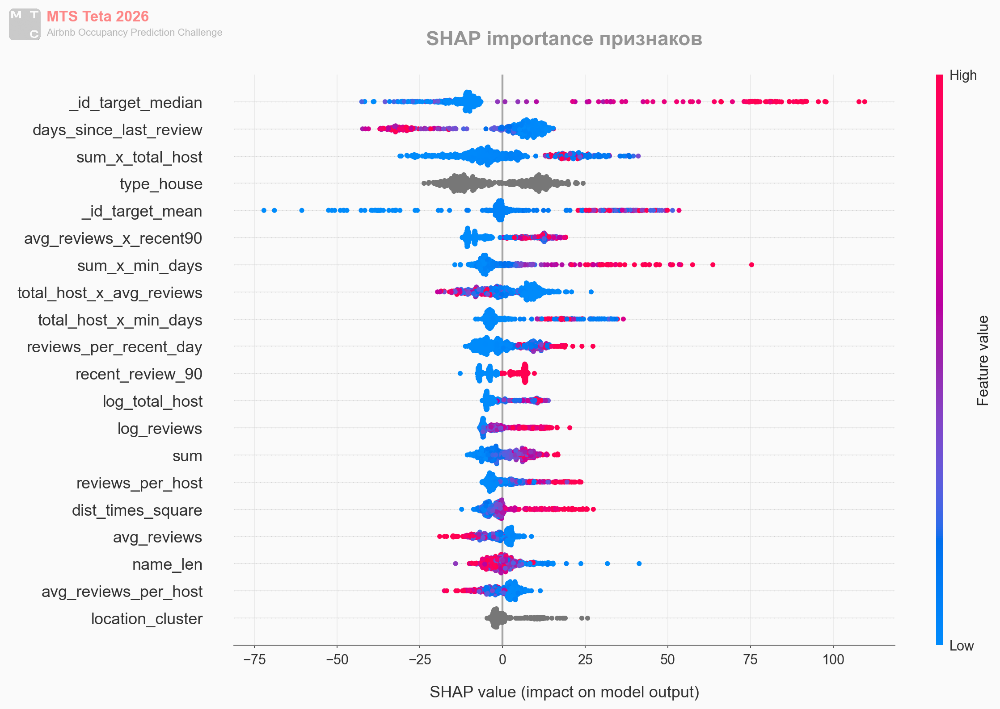

In [392]:
# SHAP feature importance на sample

X_sample = X_train.sample(500, random_state=42)

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_sample)

shap.summary_plot(shap_values, X_sample, max_display=20,
    plot_size=(12, 8), show=False,)

fig = plt.gcf()
ax = plt.gca()

fig.set_facecolor("#FAFAFA")
ax.set_facecolor("#FAFAFA")

ax.set_title("SHAP importance признаков", fontsize=16, 
             fontweight="bold", color="#949494", pad=24,)

ax.tick_params(colors="#333333")
ax.xaxis.label.set_color("#333333")
ax.yaxis.label.set_color("#333333")

for spine in ax.spines.values():
    spine.set_color("#7B7B7B")
    spine.set_linewidth(1)

add_watermark(fig)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


SHAP в целом подтверждает ту же картину, что permutation importance: явного мусора среди верхних признаков не видно, основные сигналы выглядят содержательно.

- id_target_median и _id_target_mean остаются самыми сильными признаками. Высокие значения двигают прогноз вверх, низкие – вниз. Это ожидаемо для id-based target encoding.
- type_house важен
- блок interaction features реально работает: sum_x_total_host, avg_reviews_x_recent90, sum_x_min_days, total_host_x_avg_reviews, total_host_x_min_days среди важных признаков.
- days_since_last_review: большие значения уводят прогноз вниз, что логично.
- recent_review_90, reviews_per_recent_day, log_reviews, dist_times_square дают понятные направленные эффекты.
- name_len и location_cluster слабее, но не выглядят случайными по permutatuion importance.

In [75]:
excluded_features = [
    'has_reviews',
]

model_features_basic = [
    col for col in model_features_basic
    if col not in excluded_features
]

model_features_inter = [
    col for col in model_features_inter
    if col not in excluded_features
]

---

## 3. Model Training Functions


#### CatBoost Regressor

In [76]:
# CatBoost OOF/test predictions

def run_catboost(X, y, X_test, target_bin, cat_features, params, n_splits=5):
    oof_preds = np.zeros(len(X))
    test_preds_by_fold = []

    # фильтруем категориальные признаки, только существующие в X
    cat_features_used = [col for col in cat_features if col in X.columns]
    
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=1)

    # отдельная модель на каждом фолде
    for train_idx, valid_idx in skf.split(X, target_bin):

        model = CatBoostRegressor(**params)
        model.fit(
            X.iloc[train_idx],
            y.iloc[train_idx],
            eval_set=(X.iloc[valid_idx], y.iloc[valid_idx]),
            cat_features=cat_features_used,
            verbose=False,
            early_stopping_rounds=50,
            use_best_model=True,
        )

        # oof / test предсказания для текущего фолда
        oof_preds[valid_idx] = model.predict(X.iloc[valid_idx])
        test_preds_by_fold.append(model.predict(X_test))

    return oof_preds, np.mean(test_preds_by_fold, axis=0)

#### LightGBM Regressor

In [77]:
# LightGBM OOF/test predictions

def run_lgbm(X, y, X_test, target_bin, cat_features, params, n_splits=5):
    oof_preds = np.zeros(len(X))
    test_preds_by_fold = []

    X = X.copy()
    X_test = X_test.copy()

    cat_features_used = [col for col in cat_features if col in X.columns]

    # приводим категориальные признаки к category dtype для LightGBM
    for col in cat_features_used:
        X[col] = X[col].astype('category')
        X_test[col] = X_test[col].astype('category')

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=1)

    # отдельная модель на каждом фолде
    for train_idx, valid_idx in skf.split(X, target_bin):
        model = LGBMRegressor(**params)
        model.fit(
            X.iloc[train_idx],
            y.iloc[train_idx],
            eval_set=[(X.iloc[valid_idx], y.iloc[valid_idx])],
            eval_metric='l2',
            callbacks=[early_stopping(50, verbose=False)],
        )

        # oof / test предсказания для текущего фолда
        oof_preds[valid_idx] = model.predict(X.iloc[valid_idx])
        test_preds_by_fold.append(model.predict(X_test))

    return oof_preds, np.mean(test_preds_by_fold, axis=0)

#### Sklearn tree models (RandomForest, ExtraTrees)

In [78]:
# RandomForest / ExtraTrees OOF/test predictions

def run_sklearn_tree(model_class, X, y, X_test, target_bin, cat_features, params, n_splits=5):
    oof_preds = np.zeros(len(X))
    test_preds_by_fold = []

    cat_features_used = [col for col in cat_features if col in X.columns]

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=1)

    # отдельная модель на каждом фолде
    for train_idx, valid_idx in skf.split(X, target_bin):
        X_train = X.iloc[train_idx].copy()
        X_valid = X.iloc[valid_idx].copy()
        X_test_fold = X_test.copy()

        # кодируем категориальные признаки внутри фолда 
        if cat_features_used:
            encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
            X_train[cat_features_used] = encoder.fit_transform(X_train[cat_features_used].astype(str))
            X_valid[cat_features_used] = encoder.transform(X_valid[cat_features_used].astype(str))
            X_test_fold[cat_features_used] = encoder.transform(X_test_fold[cat_features_used].astype(str))

        model = model_class(**params)
        model.fit(X_train, y.iloc[train_idx])

        # oof / test предсказания для текущего фолда
        oof_preds[valid_idx] = model.predict(X_valid)
        test_preds_by_fold.append(model.predict(X_test_fold))

    return oof_preds, np.mean(test_preds_by_fold, axis=0)


---

## 4. Base Models


In [79]:
oof_matrix_full = pd.DataFrame(index=X.index)
test_matrix_full = pd.DataFrame(index=X_test.index)

### 4.1 CatBoost RMSE

In [80]:
# параметры выбраны по раннему OOF-тюнингу CatBoost
cb_best_params = {
    'depth': 8,
    'random_strength': 1.0,
    'iterations': 1200,
    'border_count': 96,
    'random_seed': 1,
    'learning_rate': 0.05,
    'l2_leaf_reg': 4,
    'bagging_temperature': 0.5,
    'loss_function': 'RMSE',
    'verbose': 0,
}

In [ ]:
# CatBoost for basic features

oof_cb, test_cb = run_catboost(
    X[model_features_basic],
    y,
    X_test[model_features_basic],
    target_bin,
    cat_features_basic,
    cb_best_params,
    n_splits=5,
)

print(f'CatBoost MSE: {mean_squared_error(y, oof_cb):.4f}')

# CatBoost MSE: 8940.7065 (basic features)

CatBoost MSE: 8940.7065


In [82]:
oof_matrix_full['catboost'] = oof_cb
test_matrix_full['catboost'] = test_cb

In [ ]:
# CatBoost for basic + interactions features

oof_cb_inter, test_cb_inter = run_catboost(
    X[model_features_inter],
    y,
    X_test[model_features_inter],
    target_bin,
    cat_features_inter,
    cb_best_params,
    n_splits=5,
)

print(f'CatBoost MSE: {mean_squared_error(y, oof_cb_inter):.4f}')

# CatBoost MSE (basic + interactions): 8918.3854

CatBoost MSE: 8918.3854


In [84]:
oof_matrix_full['catboost_inter'] = oof_cb_inter
test_matrix_full['catboost_inter'] = test_cb_inter

### 4.2 LightGBM


In [85]:
# параметры выбраны по раннему OOF-тюнингу LightGBM

lgbm_best_params = {
    'n_estimators': 1000,
    'random_state': 1,
    'n_jobs': 4,
    'verbose': -1,
    'learning_rate': 0.045,
    'num_leaves': 63,
    'min_child_samples': 20,
}

In [ ]:
oof_lgbm, test_lgbm = run_lgbm(
    X[model_features_basic],
    y,
    X_test[model_features_basic],
    target_bin,
    cat_features_basic,
    lgbm_best_params,
    n_splits=5,
)

print(f'LightGBM MSE: {mean_squared_error(y, oof_lgbm):.4f}')

# LightGBM MSE: 9049.6137 – basic features

LightGBM MSE: 9049.6137


In [87]:
oof_matrix_full['lgbm'] = oof_lgbm
test_matrix_full['lgbm'] = test_lgbm

Добавление interaction features в LightGBM ухудшает метрику MSE, поэтому в мета-модель этот вариант не идет. \
В мета-модель передаем предсказания LightGBM для basic features.

### 4.3 RandomForest 

In [88]:
rf_params = {
    'n_estimators': 500,
    'max_depth': 18,
    'min_samples_leaf': 5,
    'max_features': 0.7,
    'n_jobs': -1,
    'random_state': 42,
}

In [ ]:
# RandomForest Regressor: basic features

oof_rf, test_rf = run_sklearn_tree(
    RandomForestRegressor,
    X[model_features_basic],
    y,
    X_test[model_features_basic],
    target_bin,
    cat_features_basic,
    rf_params,
    n_splits=5,
)

print(f'RandomForest MSE (basic feat): {mean_squared_error(y, oof_rf):.4f}')

# RandomForest MSE: 9089.8303 (basic features)

RandomForest MSE (basic feat): 9089.8303


In [90]:
oof_matrix_full['rf'] = oof_rf
test_matrix_full['rf'] = test_rf

In [ ]:
# RandomForest Regressor: interactions features

oof_rf_inter, test_rf_inter = run_sklearn_tree(
    RandomForestRegressor,
    X[model_features_inter],
    y,
    X_test[model_features_inter],
    target_bin,
    cat_features_inter,
    rf_params,
    n_splits=5,
)

print(f'RandomForest MSE (inter feat): {mean_squared_error(y, oof_rf_inter):.4f}')

# RandomForest MSE: 9089.8303 (basic features)
# RandomForest MSE: 9086.6854 (basic + interactions)

RandomForest MSE (inter feat): 9086.6854


In [92]:
oof_matrix_full['rf_inter'] = oof_rf_inter
test_matrix_full['rf_inter'] = test_rf_inter

### 4.4 ExtraTrees

In [93]:
et_params = {
    'n_estimators': 700,
    'max_depth': None,
    'min_samples_leaf': 3,
    'max_features': 0.7,
    'n_jobs': -1,
    'random_state': 42,
}

In [ ]:
# ExtraTrees: basic features

oof_et, test_et = run_sklearn_tree(
    ExtraTreesRegressor,
    X[model_features_basic],
    y,
    X_test[model_features_basic],
    target_bin,
    cat_features_basic,
    et_params,
    n_splits=5,
)

print(f'ExtraTrees MSE (basic feat): {mean_squared_error(y, oof_et):.4f}')

# ExtraTrees MSE (basic feat): 9052.7800

ExtraTrees MSE (basic feat): 9052.7800


In [ ]:
# ExtraTrees: basic + interactions features

oof_et_inter, test_et_inter = run_sklearn_tree(
    ExtraTreesRegressor,
    X[model_features_inter],
    y,
    X_test[model_features_inter],
    target_bin,
    cat_features_inter,
    et_params,
    n_splits=5,
)

print(f'ExtraTrees MSE (basic features): {mean_squared_error(y, oof_et):.4f}')
print(f'ExtraTrees MSE (basic + interactions): {mean_squared_error(y, oof_et_inter):.4f}')

# ExtraTrees MSE (basic features): 9052.7800
# ExtraTrees MSE (basic + interactions): 9004.2325

ExtraTrees MSE (basic features): 9052.7800
ExtraTrees MSE (basic + interactions): 9004.2325


ExtraTrees с interactions features с базовыми параметрами выигрывает по MSE, проведем тюнинг модели на нескольких фиксированных наборах гиперпараметров.

In [96]:
# ExtraTrees interaction features: tuning

et_inter_param_variants = {
    'base': et_params,
    'n800': {
        **et_params,
        'n_estimators': 800,
    },
    'n900': {
        **et_params,
        'n_estimators': 900,
    },
}

et_inter_rows = []
et_inter_preds = {}

for name, params in et_inter_param_variants.items():
    print(f'Running ET interaction: {name}')

    oof_pred, test_pred = run_sklearn_tree(
        ExtraTreesRegressor,
        X[model_features_inter],
        y,
        X_test[model_features_inter],
        target_bin,
        cat_features_inter,
        params,
        n_splits=5,
    )

    mse = mean_squared_error(y, oof_pred)

    et_inter_rows.append({
        'model': name,
        'mse': mse,
    })
    et_inter_preds[name] = (oof_pred, test_pred)

et_inter_results = pd.DataFrame(et_inter_rows).sort_values('mse')
display(et_inter_results)


Running ET interaction: base
Running ET interaction: n800
Running ET interaction: n900


,model,mse
2,n900,9000.401441
1,n800,9002.725734
0,base,9004.232461


In [ ]:
best_et_inter_name = et_inter_results.iloc[0]['model']
oof_et_inter_best, test_et_inter_best = et_inter_preds[best_et_inter_name]

print(f'Selected ET interaction: {best_et_inter_name}')
print(f'ET interaction MSE: {mean_squared_error(y, oof_et_inter_best):.4f}')

# Selected ET interaction: n900
# ET interaction MSE: 9000.4014 - лучший результат для ExtraTrees

Selected ET interaction: n900
ET interaction MSE: 9000.4014


In [98]:
oof_matrix_full['et'] = oof_et
test_matrix_full['et'] = test_et

oof_matrix_full['et_inter'] = oof_et_inter_best
test_matrix_full['et_inter'] = test_et_inter_best

### 4.5 Alternative-Loss CatBoost Model


In [99]:
cb_huber_params = {
    **cb_best_params,
    'loss_function': 'Huber:delta=100',
    'eval_metric': 'RMSE',
    'verbose': 0,
}

In [ ]:
# CatBoost Huber loss on basic features

oof_cb_huber_basic, test_cb_huber_basic = run_catboost(
    X[model_features_basic],
    y,
    X_test[model_features_basic],
    target_bin,
    cat_features_basic,
    cb_huber_params,
    n_splits=5,
)

print(f'CatBoost Huber basic MSE: {mean_squared_error(y, oof_cb_huber_basic):.4f}')

# CatBoost Huber basic MSE: 9172.4018

CatBoost Huber basic MSE: 9172.4018


In [ ]:
# CatBoost Huber loss on basic + interaction features

oof_cb_huber_inter, test_cb_huber_inter = run_catboost(
    X[model_features_inter],
    y,
    X_test[model_features_inter],
    target_bin,
    cat_features_inter,
    cb_huber_params,
    n_splits=5,
)

print(f'CatBoost Huber interaction MSE: {mean_squared_error(y, oof_cb_huber_inter):.4f}')

# CatBoost Huber interaction MSE: 9153.1445

CatBoost Huber interaction MSE: 9153.1445


Оба варианта слабые как отдельные модели, но можно проверить их вклад в мета-модель

In [102]:
oof_matrix_full['cb_huber_basic'] = oof_cb_huber_basic
test_matrix_full['cb_huber_basic'] = test_cb_huber_basic

oof_matrix_full['cb_huber_inter'] = oof_cb_huber_inter
test_matrix_full['cb_huber_inter'] = test_cb_huber_inter


---

## 5. Target Mode Classifiers

In [103]:
# CatBoost classifier OOF/test probabilities

def run_catboost_classifier(X, y_bin, X_test, cat_features, params, n_splits=5):
    oof_proba = np.zeros(len(X))
    test_proba_by_fold = []

    y_bin = pd.Series(y_bin, index=X.index)
    cat_features_used = [col for col in cat_features if col in X.columns]

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=1)

    # отдельная модель на каждом фолде
    for train_idx, valid_idx in skf.split(X, y_bin):
        model = CatBoostClassifier(
            **params,
            loss_function='Logloss',
            eval_metric='AUC',
            verbose=False,
        )
        model.fit(
            X.iloc[train_idx],
            y_bin.iloc[train_idx],
            eval_set=(X.iloc[valid_idx], y_bin.iloc[valid_idx]),
            cat_features=cat_features_used,
            early_stopping_rounds=50,
            verbose=False,
        )

        # oof / test вероятности текущего фолда
        oof_proba[valid_idx] = model.predict_proba(X.iloc[valid_idx])[:, 1]
        test_proba_by_fold.append(model.predict_proba(X_test)[:, 1])

    return oof_proba, np.mean(test_proba_by_fold, axis=0)

In [104]:
clf_params = {
    'iterations': 500,
    'depth': 5,
    'learning_rate': 0.03,
    'l2_leaf_reg': 10,
    'random_seed': 42,
}

classification_targets = {
    'p0': (y == 0).astype(int),
    'p30': ((y > 0) & (y <= 30)).astype(int),
    'p350': (y >= 350).astype(int),
    'p365': (y >= 364).astype(int),
}

prob_predictions = {}
prob_results = []

for name, y_bin in classification_targets.items():
    print(f'Running classifier: {name}')

    oof_proba, test_proba = run_catboost_classifier(
        X[model_features_basic],
        y_bin,
        X_test[model_features_basic],
        cat_features_basic,
        clf_params,
        n_splits=5,
    )

    prob_predictions[name] = (oof_proba, test_proba)
    prob_results.append({
        'model': name,
        'auc': roc_auc_score(y_bin, oof_proba),
    })

prob_results_df = pd.DataFrame(prob_results).sort_values('auc', ascending=False)
display(prob_results_df)


Running classifier: p0
Running classifier: p30
Running classifier: p350
Running classifier: p365


,model,auc
0,p0,0.921439
3,p365,0.871983
2,p350,0.859026
1,p30,0.788556


Самые сильные классификаторы таргета – для 0 и 365. Промежуточные классификаторы (p30, p350) слабее по AUC, но могут добавить полезный сигнал в мета-модель, оставим их как кандидатов.

In [105]:
# добавляем probability features в full meta-matrix

for name, (oof_proba, test_proba) in prob_predictions.items():
    oof_matrix_full[name] = oof_proba
    test_matrix_full[name] = test_proba


---

## 6. Weighted CB

Базовые модели и meta-model склонны сглаживать предсказания к среднему диапазону таргета, верхний хвост (300+, 350+) систематически недооценивается, а нулевые и околонулевые значения часто переоцениваются. 

Weighted CatBoost-модели добавлены как отдельные специализированные ветки. Через `sample_weight` они сильнее штрафуют ошибки на проблемных зонах таргета.

In [ ]:
# Weighted CatBoost OOF/test predictions

def run_weighted_catboost(X, y, X_test, target_bin, cat_features,
    params, sample_weight, n_splits=5,):

    oof_preds = np.zeros(len(X))
    test_preds_by_fold = []

    sample_weight = pd.Series(sample_weight, index=y.index)
    cat_features_used = [col for col in cat_features if col in X.columns]

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # отдельная модель на каждом фолде
    for train_idx, valid_idx in skf.split(X, target_bin):
        model = CatBoostRegressor(**params)
        model.fit(
            X.iloc[train_idx],
            y.iloc[train_idx],
            sample_weight=sample_weight.iloc[train_idx],
            eval_set=(X.iloc[valid_idx], y.iloc[valid_idx]),
            cat_features=cat_features_used,
            verbose=False,
            early_stopping_rounds=50,
            use_best_model=True,
        )

        # oof / test предсказания для текущего фолда
        oof_preds[valid_idx] = model.predict(X.iloc[valid_idx])
        test_preds_by_fold.append(model.predict(X_test))

    return oof_preds, np.mean(test_preds_by_fold, axis=0)

In [107]:
# Weighted CatBoost models for target tails

weighted_cb_params = cb_best_params.copy()

target_weight_variants = {
    'cb_w_high': np.select(
        [y >= 350, y >= 300],
        [2.5, 1.75],
        default=1.0,
    ),
    'cb_w_top': np.select(
        [y >= 350, y >= 300],
        [3.0, 1.35],
        default=1.0,
    ),
    'cb_w_zero_high': np.select(
        [y == 0, y >= 350, y >= 300],
        [1.35, 3.0, 1.75],
        default=1.0,
    ),
}

weighted_predictions = {}
weighted_results = []

for name, sample_weight in target_weight_variants.items():
    print(f'Running weighted CatBoost: {name}')

    oof_pred, test_pred = run_weighted_catboost(
        X[model_features_inter],
        y,
        X_test[model_features_inter],
        target_bin=target_bin,
        cat_features=cat_features_inter,
        params=weighted_cb_params,
        sample_weight=sample_weight,
        n_splits=5,
    )

    mse = mean_squared_error(y, oof_pred)

    weighted_predictions[name] = (oof_pred, test_pred)
    weighted_results.append({
        'model': name,
        'mse': mse,
    })

weighted_results_df = pd.DataFrame(weighted_results).sort_values('mse')
display(weighted_results_df)


Running weighted CatBoost: cb_w_high
Running weighted CatBoost: cb_w_top
Running weighted CatBoost: cb_w_zero_high


,model,mse
2,cb_w_zero_high,9167.099127
0,cb_w_high,9195.317962
1,cb_w_top,9250.406902


In [108]:
for name, (oof_pred, test_pred) in weighted_predictions.items():
    oof_matrix_full[name] = oof_pred
    test_matrix_full[name] = test_pred

---

## 8. Stacking

#### Meta-matrix

In [109]:
oof_matrix_full.columns

Index(['catboost', 'catboost_inter', 'lgbm', 'rf', 'rf_inter', 'et',
       'et_inter', 'cb_huber_basic', 'cb_huber_inter', 'p0', 'p30', 'p350',
       'p365', 'cb_w_high', 'cb_w_top', 'cb_w_zero_high'],
      dtype='str')

In [110]:
assert list(oof_matrix_full.columns) == list(test_matrix_full.columns)
assert len(oof_matrix_full) == len(X)
assert len(test_matrix_full) == len(X_test)

---

### 8.1 Basic meta-model

In [111]:
# CatBoost meta-model OOF/test predictions

def run_meta_catboost(oof_matrix, y, test_matrix, target_bin, params, n_splits=5):
    meta_oof = np.zeros(len(oof_matrix))
    meta_test_by_fold = []

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # отдельная meta-model на каждом фолде
    for train_idx, valid_idx in skf.split(oof_matrix, target_bin):
        model = CatBoostRegressor(**params)
        model.fit(
            oof_matrix.iloc[train_idx],
            y.iloc[train_idx],
            eval_set=(oof_matrix.iloc[valid_idx], y.iloc[valid_idx]),
            use_best_model=True,
            early_stopping_rounds=50,
            verbose=False,
        )

        # oof / test предсказания текущего фолда
        meta_oof[valid_idx] = model.predict(oof_matrix.iloc[valid_idx])
        meta_test_by_fold.append(model.predict(test_matrix))

    return meta_oof, np.mean(meta_test_by_fold, axis=0)

In [112]:
meta_params = {
    'iterations': 300,
    'learning_rate': 0.03,
    'depth': 2,
    'l2_leaf_reg': 10.0,
    'random_strength': 2.0,
    'loss_function': 'RMSE',
    'verbose': False,
}

In [ ]:
# Base meta-model on all available predictions

oof_matrix_all = oof_matrix_full.copy()
test_matrix_all = test_matrix_full.copy()

display(pd.DataFrame({'feature': oof_matrix_all.columns}))

oof_meta_all, test_meta_all = run_meta_catboost(
    oof_matrix_all,
    y,
    test_matrix_all,
    target_bin,
    meta_params,
    n_splits=5,
)

meta_all_mse = mean_squared_error(y, oof_meta_all)
print(f'Base Meta CatBoost MSE (all inputs): {meta_all_mse:.4f}')

# Base Meta CatBoost MSE (all inputs): 8747.8750

,feature
0,catboost
1,catboost_inter
2,lgbm
3,rf
4,rf_inter
5,et
6,et_inter
7,cb_huber_basic
8,cb_huber_inter
9,p0


Base Meta CatBoost MSE (all inputs): 8747.875044


---

### 8.2 Meta Input Selection

In [114]:
# leave-one-out check for meta inputs

def check_meta_input_contribution(oof_matrix, y, test_matrix, target_bin,
    meta_params, base_oof_preds, n_splits=5,
):
    base_mse = mean_squared_error(y, base_oof_preds)

    standalone_mse = {
        col: mean_squared_error(y, oof_matrix[col])
        for col in oof_matrix.columns
    }

    rows = [{
        'removed': 'none',
        'standalone_mse': np.nan,
        'n_features': oof_matrix.shape[1],
        'mse': base_mse,
        'delta_vs_base': 0.0,
    }]

    for col in oof_matrix.columns:
        cols = [c for c in oof_matrix.columns if c != col]

        oof_tmp, _ = run_meta_catboost(
            oof_matrix[cols],
            y,
            test_matrix[cols],
            target_bin,
            meta_params,
            n_splits=n_splits,
        )

        mse = mean_squared_error(y, oof_tmp)

        rows.append({
            'removed': col,
            'standalone_mse': standalone_mse[col],
            'n_features': len(cols),
            'mse': mse,
            'delta_vs_base': mse - base_mse,
        })

    return (
        pd.DataFrame(rows)
        .sort_values('delta_vs_base', ascending=False)
        .reset_index(drop=True)
    )


In [115]:
# вклад признаков базовой мета-модели

meta_input_check = check_meta_input_contribution(
    oof_matrix_all,
    y,
    test_matrix_all,
    target_bin,
    meta_params,
    oof_meta_all,
    n_splits=5,
)

display(meta_input_check)


,removed,standalone_mse,n_features,mse,delta_vs_base
0,et,9052.779962,15,8763.184586,15.309542
1,p0,29999.583921,15,8760.262255,12.387211
2,et_inter,9000.401441,15,8758.969881,11.094837
3,cb_w_high,9195.317962,15,8758.713287,10.838242
4,p30,30010.510943,15,8757.379680,9.504636
5,p350,30000.986827,15,8757.300001,9.424956
6,p365,30015.059555,15,8757.090409,9.215365
7,cb_huber_basic,9172.401835,15,8756.263729,8.388685
8,cb_huber_inter,9153.144482,15,8755.434819,7.559775
9,catboost,8940.706497,15,8755.000647,7.125602


Эта ablation проверяет вклад входов мета-модели до добавления lookup-признаков. В стеке 16 входов: базовые регрессоры, interaction-ветки, Huber CatBoost, вероятностные признаки режимов таргета и weighted CatBoost-модели.

Удаление любой колонки ухудшает качество, значит все 16 входов дают положительный вклад. Самыми важными оказались _et_, _p0_, _et_inter_, _cb_w_high_, _p30_, _p350_, _p365_. Standalone MSE не равен полезности для мета-модели: вероятностные признаки имеют высокий standalone MSE, но помогают мета-модели распознавать режимы таргета.

Самый сильный вклад в ансамбль дают _et_, _p0_, _et_inter_, _cb_w_high_, _p30_, _p350_, _p365_. Даже probability-признаки имеют плохой standalone MSE, но полезны как признаки для мета-модели, потому что несут информацию о режимах таргета. При удалении _et_ качество ухудшается сильнее всего.

Следующий шаг: расширить входы мета-модели lookup-признаками по повторяющимся объектам и составному ключу host/listing. После этого ablation нужно повторять уже на расширенной матрице.

---

### 8.3 Lookup Features

В данных есть повторяющиеся или почти повторяющиеся объекты: одинаковые id, а также похожие комбинации хоста, района, типа жилья, цены и минимального срока аренды. Для таких групп полезно дать meta-model агрегированный сигнал о том, какой таргет был у похожих объектов в train.

Чтобы не допустить утечку таргета, lookup-признаки для train считаются OOF-схемой: для каждой validation-части статистики строятся только по train-части текущего фолда. Для test статистики считаются на каждом train-fold и затем усредняются.

Используются два lookup-ключа: точное совпадение id и более широкий составной ключ [host_name + location + type_house + sum + min_days], который ищет похожие объявления одного хоста.

В lookup-признаки входят:
- средний таргет по ключу;
- число совпадений ключа;
- стандартное отклонение таргета по ключу;
- флаг, нашелся ли ключ в train-fold.


In [ ]:
# Lookup features

def make_lookup_key(df, key_cols):
    # склеиваем несколько колонок в один строковый ключ для группировки
    key_df = df[key_cols].copy()

    for col in key_cols:
        key_df[col] = key_df[col].fillna('__NA__').astype(str)

    return key_df.apply(lambda row: '||'.join(row), axis=1)



def build_oof_lookup_features(X, y, X_test, target_bin,
    key_cols, prefix, n_splits=5, random_state=42,
):
    # имена lookup-признаков для выбранного ключа
    lookup_cols = [
        f'{prefix}_mean',
        f'{prefix}_count',
        f'{prefix}_std',
        f'{prefix}_matched',
    ]

    # контейнер OOF lookup-признаков для train
    lookup_oof = pd.DataFrame(index=X.index, columns=lookup_cols, dtype=float)

    # контейнер test lookup-признаков, посчитанных на каждом фолде
    test_lookup_by_fold = []

    # test-ключ можно посчитать один раз, он не зависит от фолда
    test_key = make_lookup_key(X_test, key_cols)

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)

    # считаем lookup-статистики на фолдах
    for train_idx, valid_idx in skf.split(X, target_bin):

        # ключи для train-части фолда и validation-части фолда
        train_key = make_lookup_key(X.iloc[train_idx], key_cols)
        valid_key = make_lookup_key(X.iloc[valid_idx], key_cols)

        # статистики таргета считаются только на train-части текущего фолда
        target_stats = (
            pd.DataFrame({
                'key': train_key,
                'target': y.iloc[train_idx].values,
            })
            .groupby('key')['target']
            .agg(['mean', 'count', 'std'])
        )

        # переносим статистики на validation по совпадению ключа
        lookup_oof.loc[X.index[valid_idx], f'{prefix}_mean'] = valid_key.map(target_stats['mean']).values
        lookup_oof.loc[X.index[valid_idx], f'{prefix}_count'] = valid_key.map(target_stats['count']).values
        lookup_oof.loc[X.index[valid_idx], f'{prefix}_std'] = valid_key.map(target_stats['std']).values

        # переносим статистики на test; потом усредним результаты по фолдам
        test_lookup_by_fold.append(pd.DataFrame({
            f'{prefix}_mean': test_key.map(target_stats['mean']),
            f'{prefix}_count': test_key.map(target_stats['count']),
            f'{prefix}_std': test_key.map(target_stats['std']),
        }, index=X_test.index))

    # флаг: нашелся ли ключ в train-части соответствующего фолда
    lookup_oof[f'{prefix}_matched'] = lookup_oof[f'{prefix}_mean'].notna().astype(int)

    # fallback для train-строк, где ключ не встретился в train-части фолда
    lookup_oof[f'{prefix}_mean'] = lookup_oof[f'{prefix}_mean'].fillna(y.mean())
    lookup_oof[f'{prefix}_count'] = lookup_oof[f'{prefix}_count'].fillna(0)
    lookup_oof[f'{prefix}_std'] = lookup_oof[f'{prefix}_std'].fillna(y.std())

    # усредняем test lookup-признаки по фолдам
    lookup_test = pd.concat(test_lookup_by_fold).groupby(level=0).mean()

    # флаг: нашелся ли test-ключ хотя бы в среднем по fold-lookup
    lookup_test[f'{prefix}_matched'] = lookup_test[f'{prefix}_mean'].notna().astype(int)

    # fallback для test-строк без совпадений ключа
    lookup_test[f'{prefix}_mean'] = lookup_test[f'{prefix}_mean'].fillna(y.mean())
    lookup_test[f'{prefix}_count'] = lookup_test[f'{prefix}_count'].fillna(0)
    lookup_test[f'{prefix}_std'] = lookup_test[f'{prefix}_std'].fillna(y.std())

    return lookup_oof, lookup_test


In [117]:
# lookup по точному совпадению _id
lookup_id_oof, lookup_id_test = build_oof_lookup_features(
    X,
    y,
    X_test,
    target_bin,
    key_cols=['_id'],
    prefix='lookup_id',
)

# lookup по похожим объявлениям одного хоста
lookup_host_listing_oof, lookup_host_listing_test = build_oof_lookup_features(
    X,
    y,
    X_test,
    target_bin,
    key_cols=['host_name', 'location', 'type_house', 'sum', 'min_days'],
    prefix='lookup_host_listing',
)


In [118]:
display(lookup_id_oof.sample(3))
display(lookup_host_listing_oof.sample(3))

,lookup_id_mean,lookup_id_count,lookup_id_std,lookup_id_matched
22762,291.833333,12.0,78.972761,1
23070,112.766628,0.0,131.583284,0
23515,112.766628,0.0,131.583284,0


,lookup_host_listing_mean,lookup_host_listing_count,lookup_host_listing_std,lookup_host_listing_matched
22903,112.766628,0.0,131.583284,0
35694,112.766628,0.0,131.583284,0
34764,112.766628,0.0,131.583284,0


In [119]:
lookup_cols = list(lookup_id_oof.columns) + list(lookup_host_listing_oof.columns)

oof_matrix_full = oof_matrix_full.drop(columns=lookup_cols, errors='ignore')
test_matrix_full = test_matrix_full.drop(columns=lookup_cols, errors='ignore')

oof_matrix_full = pd.concat([oof_matrix_full, lookup_id_oof, lookup_host_listing_oof], axis=1)
test_matrix_full = pd.concat([test_matrix_full, lookup_id_test, lookup_host_listing_test], axis=1)

In [120]:
assert list(oof_matrix_full.columns) == list(test_matrix_full.columns)
assert not oof_matrix_full.columns.duplicated().any()

In [144]:
# подготавливаем inputs meta-model для отбора

selected_meta_cols = [
    'catboost',
    'catboost_inter',
    'lgbm',
    'rf',
    'rf_inter',
    'et',
    'et_inter',

    'cb_huber_basic',
    'cb_huber_inter',

    'p0',
    # 'p30',
    'p350',
    'p365',

    'cb_w_high',
    'cb_w_top',
    'cb_w_zero_high',

    'lookup_id_mean',
    'lookup_id_count',
    'lookup_id_std',
    'lookup_id_matched',

    'lookup_host_listing_mean',
    'lookup_host_listing_count',
    'lookup_host_listing_std',
    'lookup_host_listing_matched',
]

In [145]:
# фильтруем отобранные базовые предсказания

oof_matrix_selected = oof_matrix_full[selected_meta_cols].copy()
test_matrix_selected = test_matrix_full[selected_meta_cols].copy()

In [ ]:
# обучаем мета-модель с добавленными lookup-признаками

oof_meta_lookup, test_meta_lookup = run_meta_catboost(
    oof_matrix_selected,
    y,
    test_matrix_selected,
    target_bin,
    meta_params,
    n_splits=5,
)

print(f'Meta CatBoost with lookup MSE: {mean_squared_error(y, oof_meta_lookup):.2f}')

# Base Meta CatBoost MSE (all inputs): 8747.87
# Meta CatBoost with lookup MSE: 8688.16
# Meta CatBoost with lookup MSE: 8678.25 - remove 'p30'


Meta CatBoost with lookup MSE: 8678.25


In [147]:
meta_input_check_lookup = check_meta_input_contribution(
    oof_matrix_selected,
    y,
    test_matrix_selected,
    target_bin,
    meta_params,
    oof_meta_lookup,
    n_splits=5,
)

display(meta_input_check_lookup)


,removed,standalone_mse,n_features,mse,delta_vs_base
0,lookup_id_mean,12951.004132,22,8740.291630,62.044717
1,et,9052.779962,22,8698.459176,20.212263
2,lookup_id_count,28472.677620,22,8688.884897,10.637984
3,lookup_host_listing_count,29936.371874,22,8688.758020,10.511107
4,lookup_id_std,20973.101915,22,8688.706130,10.459217
5,p0,29999.583921,22,8688.703331,10.456419
6,et_inter,9000.401441,22,8688.558150,10.311237
7,lookup_host_listing_mean,15694.451343,22,8688.532874,10.285961
8,lookup_host_listing_std,18693.848519,22,8688.509838,10.262925
9,lgbm,9049.613705,22,8687.734333,9.487420


После добавления lookup-признаков мета-модель заметно усилилась. Главный новый сигнал _lookup_id_mean_, если его убрать, ошибка растет сильнее всего. Это логично: часть объектов из test уже встречается в train по _id_, и средний target по таким совпадениям оказывается очень информативным.

Остальные lookup-признаки тоже полезны: _lookup_id_count_, _lookup_id_std_, _lookup_host_listing_mean_, _lookup_host_listing_count_, _lookup_host_listing_std_, а также признаки совпадения ключа. Их standalone MSE высокий, но для мета-модели они важны как индикаторы надежности lookup-сигнала.

Из финального набора стека убрали _p30_. В варианте с lookup его удаление улучшало результат: без _p30_ ошибка снизилась. Все оставшиеся признаки при удалении ухудшают качество, то есть каждый вход дает положительный вклад.

После удаления _p30_ среди самых полезных входов, кроме _lookup_id_mean_, остаются _et_, другие lookup-признаки, _p0_, _et_inter_, _lgbm_, _rf_inter_, _catboost_inter_, _rf_ и weighted CatBoost-ветки. lookup не заменил базовые модели, а добавил отдельный сильный источник информации.

Вероятностные признаки режимов таргета тоже остались полезны, но не все. _p0_, _p350_ и _p365_ сохраняют положительный вклад, потому что помогают мета-модели учитывать нулевой и верхний режимы таргета. А _p30_ после добавления lookup стал лишним: его сигнал, вероятно, пересекался с другими признаками и добавлял шум.

---

### 8.4 Final Meta-model tuning

In [139]:
# Meta CatBoost hyperparameter tuning

meta_param_variants = {
    'current': meta_params,

    'old_best': {
        **meta_params,
        'iterations': 400,
        'learning_rate': 0.025,
        'depth': 3,
        'l2_leaf_reg': 12.0,
        'random_strength': 3.0,
    },

    'depth2_more_iterations': {
        **meta_params,
        'iterations': 500,
        'learning_rate': 0.02,
    },

    'depth3_base_reg': {
        **meta_params,
        'iterations': 400,
        'learning_rate': 0.025,
        'depth': 3,
        'l2_leaf_reg': 10.0,
        'random_strength': 2.0,
    },

    'depth3_more_reg': {
        **meta_params,
        'iterations': 400,
        'learning_rate': 0.025,
        'depth': 3,
        'l2_leaf_reg': 15.0,
        'random_strength': 3.0,
    },
}

meta_tune_rows = {}
meta_tune_preds = {}

for name, params in meta_param_variants.items():
    print(f'Running meta CatBoost: {name}')

    oof_meta, test_meta = run_meta_catboost(
        oof_matrix_selected,
        y,
        test_matrix_selected,
        target_bin,
        params,
        n_splits=5,
    )

    meta_tune_rows[name] = mean_squared_error(y, oof_meta)
    meta_tune_preds[name] = (oof_meta, test_meta)

meta_tune_df = (
    pd.Series(meta_tune_rows, name='mse')
    .reset_index()
    .rename(columns={'index': 'model'})
    .sort_values('mse')
)

display(meta_tune_df)


Running meta CatBoost: current
Running meta CatBoost: old_best
Running meta CatBoost: depth2_more_iterations
Running meta CatBoost: depth3_base_reg
Running meta CatBoost: depth3_more_reg


,model,mse
3,depth3_base_reg,8651.203451
1,old_best,8662.559020
4,depth3_more_reg,8663.633077
0,current,8678.246913
2,depth2_more_iterations,8679.204429


In [ ]:
best_meta_name = meta_tune_df.iloc[0]['model']
oof_meta_final, test_meta_final = meta_tune_preds[best_meta_name]

print(f'Selected meta CatBoost: {best_meta_name}')
print(f'Final Meta CatBoost MSE: {mean_squared_error(y, oof_meta_final):.2f}')

# Selected meta CatBoost: depth3_base_reg
# Final Meta CatBoost MSE: 8655.56

Selected meta CatBoost: depth3_base_reg
Final Meta CatBoost MSE: 8655.56


---

### 8.5 Seed Ensemble for Meta-Model

Финальная meta-model чувствительна к random_seed. Даже при одинаковом наборе meta features и одинаковых гиперпараметрах CatBoost может давать немного разные OOF/test предсказания из-за случайности внутри обучения. Чтобы снизить зависимость финального результата от одного запуска и сделать MSE стабильнее обучим одну и ту же meta-model несколько раз с разными random_seed и усредним предсказания.

In [ ]:
# Seed ensemble для лучшей meta-model

best_meta_params = meta_param_variants[best_meta_name].copy()

meta_seed_rows = []
meta_seed_oof_preds = []
meta_seed_test_preds = []

for seed in [1, 7, 13, 42, 101]:
    params_seed = {
        **best_meta_params,
        'random_seed': seed,
    }

    print(f'Running meta CatBoost seed: {seed}')

    oof_seed, test_seed = run_meta_catboost(
        oof_matrix_selected,
        y,
        test_matrix_selected,
        target_bin,
        params_seed,
        n_splits=5,
    )

    meta_seed_rows.append({
        'seed': seed,
        'mse': mean_squared_error(y, oof_seed),
    })

    meta_seed_oof_preds.append(oof_seed)
    meta_seed_test_preds.append(test_seed)

meta_seed_df = (
    pd.DataFrame(meta_seed_rows)
    .sort_values('mse')
)

display(meta_seed_df)

oof_meta_seed_ensemble = np.mean(meta_seed_oof_preds, axis=0)
test_meta_seed_ensemble = np.mean(meta_seed_test_preds, axis=0)

print(f'Best single meta MSE: {mean_squared_error(y, oof_meta_final):.6f}')
print(f'Seed ensemble meta MSE: {mean_squared_error(y, oof_meta_seed_ensemble):.6f}')

# Best single seed meta MSE: 8655.56
# Seed ensemble meta MSE:    8646.57

Running meta CatBoost seed: 1
Running meta CatBoost seed: 7
Running meta CatBoost seed: 13
Running meta CatBoost seed: 42
Running meta CatBoost seed: 101


,seed,mse
0,1,8645.155705
2,13,8649.145677
4,101,8651.097983
1,7,8654.181473
3,42,8655.684435


Best single meta MSE: 8655.564884
Seed ensemble meta MSE: 8646.577340


Seed ensemble улучшил результат относительно лучшей одиночной meta-model, поэтому финальные meta-предсказания берутся как среднее по нескольким запускам CatBoost с разными random_seed.

In [ ]:
oof_meta_final = oof_meta_seed_ensemble
test_meta_final = test_meta_seed_ensemble

print(f'Final Meta CatBoost MSE: {mean_squared_error(y, oof_meta_final):.2f}')

# Final Meta CatBoost MSE: 8646.58

Final Meta CatBoost MSE: 8646.58


---

In [129]:
# # Save submission

# submission = pd.read_csv('data/sample_submition.csv')
# submission['prediction'] = np.clip(test_meta_final, 0, 365)

# assert len(submission) == len(X_test)
# assert submission['prediction'].isna().sum() == 0
# assert submission['prediction'].between(0, 365).all()

# submission_path = 'submissions/submission_meta_lookup_depth3_seed_ensemble.csv'
# submission.to_csv(submission_path, index=False)

# print(submission_path)
# print(f'Final Meta CatBoost MSE: {mean_squared_error(y, oof_meta_final):.6f}')


---

## 9. Residual Diagnostics

In [396]:
# как финальная модель ошибается в разных диапазонах target

df_err = pd.DataFrame({
    'y_true': y.values,
    'pred': np.clip(oof_meta_final, 0, 365),
})

# residual = y_true - pred:
df_err['residual'] = df_err['y_true'] - df_err['pred']
df_err['abs_error'] = df_err['residual'].abs()
df_err['sq_error'] = df_err['residual'] ** 2

# бины target для диагностики ошибок
bins_eval = [0, 1, 10, 30, 60, 100, 150, 200, 250, 300, 350, 365]

df_err['target_bin_eval'] = pd.cut(
    df_err['y_true'],
    bins=bins_eval,
    include_lowest=True,
)

# агрегируем ошибки по бинам target
err_by_bin = (
    df_err
    .groupby('target_bin_eval', observed=False)
    .agg(
        n=('y_true', 'size'),
        y_mean=('y_true', 'mean'),
        pred_mean=('pred', 'mean'),
        residual_mean=('residual', 'mean'),
        mae=('abs_error', 'mean'),
        mse=('sq_error', 'mean'),
        se_sum=('sq_error', 'sum'),
    )
)

# доля объектов в каждом бине
err_by_bin['n_%'] = 100 * err_by_bin['n'] / len(df_err)

# вклад каждого бина в общую squared error
err_by_bin['mse_%'] = 100 * err_by_bin['se_sum'] / df_err['sq_error'].sum()

# порядок колонок
err_by_bin = err_by_bin[
    [
        'n',
        'n_%',
        'mse',
        'mse_%',
        'y_mean',
        'pred_mean',
        'residual_mean',
        'mae',
    ]
].reset_index().round(3)

display(err_by_bin)

print(f"Минимальное предсказание: {oof_meta_final.min():.1f}")
print(f"Минимальное предсказание: {oof_meta_final.max():.1f}")


,target_bin_eval,n,n_%,mse,mse_%,y_mean,pred_mean,residual_mean,mae
0,"(-0.001, 1.0]",13456,36.694,3890.956,16.512,0.023,40.719,-40.696,40.696
1,"(1.0, 10.0]",1653,4.508,8046.592,4.195,5.604,79.245,-73.641,73.662
2,"(10.0, 30.0]",1995,5.440,7970.446,5.015,19.545,90.790,-71.245,72.077
3,"(30.0, 60.0]",2244,6.119,6980.388,4.940,44.241,106.360,-62.118,66.519
4,"(60.0, 100.0]",2972,8.104,5245.893,4.917,80.500,120.448,-39.947,56.270
5,"(100.0, 150.0]",1743,4.753,3751.570,2.062,126.127,137.342,-11.215,48.845
6,"(150.0, 200.0]",2612,7.123,6164.559,5.078,174.513,146.930,27.583,62.622
7,"(200.0, 250.0]",1761,4.802,7948.391,4.414,227.883,172.482,55.401,70.509
8,"(250.0, 300.0]",2162,5.896,12921.633,8.811,275.631,187.906,87.725,93.443
9,"(300.0, 350.0]",3558,9.702,18843.274,21.144,327.707,220.942,106.765,107.735


Минимальное предсказание: -0.3
Минимальное предсказание: 346.2


Диагностика по бинам показывает главную ошибку модели: предсказания все еще стягиваются к середине.

Нижний край таргета модель завышает: для объектов с почти нулевым _target_ средний прогноз остается заметно выше нуля (~40), и один только этот бин дает около 16% общей MSE.

В среднем диапазоне ошибка меньше: примерно около 100-150 средний прогноз ближе всего к реальному среднему target.

Верхний хвост модель наоборот недооценивает. Два верхних бина 300-350 и 350-365 дают почти половину всей MSE, хотя содержат меньше пятой части объектов. Это главный оставшийся источник ошибки.

Вывод: weighted-модели и lookup-признаки улучшили хвосты, но не сняли проблему полностью. Дальнейший прирост скорее нужно искать в лучшем разделении near-zero объектов и верхнего хвоста 300+, а не в общей калибровке всех предсказаний сразу.


In [395]:
# проверяем, насколько prob_365 помогает отделить настоящий верхний хвост target

tmp = df_err.copy()
tmp['p365'] = oof_matrix_selected['p365'].values

# делим объекты на 10 групп по уверенности p365
tmp['p365_bin'] = pd.qcut(
    tmp['p365'].rank(method='first'),
    10,
    labels=False,
)

prob365_profile = (
    tmp
    .groupby('p365_bin')
    .agg(
        n=('y_true', 'size'),
        y_mean=('y_true', 'mean'),
        pred_mean=('pred', 'mean'),
        residual_mean=('residual', 'mean'),
        mae=('abs_error', 'mean'),
        mse=('sq_error', 'mean'),
        p365_mean=('p365', 'mean'),
        share_350_plus=('y_true', lambda s: (s > 350).mean()),
        share_300_plus=('y_true', lambda s: (s > 300).mean()),
    )
    .reset_index()
    .round(3)
)

display(prob365_profile)


,p365_bin,n,y_mean,pred_mean,residual_mean,mae,mse,p365_mean,share_350_plus,share_300_plus
0,0,3668,91.519,92.113,-0.594,62.058,7007.796,0.005,0.005,0.044
1,1,3667,79.618,80.902,-1.284,53.233,6094.564,0.007,0.010,0.059
2,2,3667,79.471,77.745,1.726,55.137,6782.515,0.009,0.017,0.073
3,3,3667,75.389,77.759,-2.371,54.867,6629.035,0.011,0.019,0.074
4,4,3667,79.774,79.437,0.338,57.064,7092.397,0.014,0.025,0.089
5,5,3667,85.657,85.367,0.290,63.312,8349.583,0.017,0.034,0.104
6,6,3667,101.651,100.421,1.230,69.552,9309.880,0.022,0.044,0.147
7,7,3667,127.964,127.105,0.858,78.247,10741.151,0.029,0.065,0.196
8,8,3667,162.633,162.550,0.083,87.747,12544.256,0.044,0.116,0.302
9,9,3667,243.997,244.176,-0.180,83.677,11915.044,0.203,0.352,0.567


_p365_ хорошо ранжирует high-tail объекты: в верхних бинах растут средний target и доля объектов 300+/350+. Но даже в самом верхнем бине только около 35% объектов имеют target > 350. Значит, _p365_ полезен как признак для мета-модели, но недостаточно чистый для ручного правила “поднять всем прогноз”.

Верхний бин по _p365_ почти откалиброван по среднему: _y_mean_ и _pred_mean_ близки. При этом MAE и MSE остаются высокими, потому что внутри бина смешаны настоящие high-tail объекты и false positives. Поэтому среднее выглядит хорошо, но индивидуальные ошибки остаются большими.


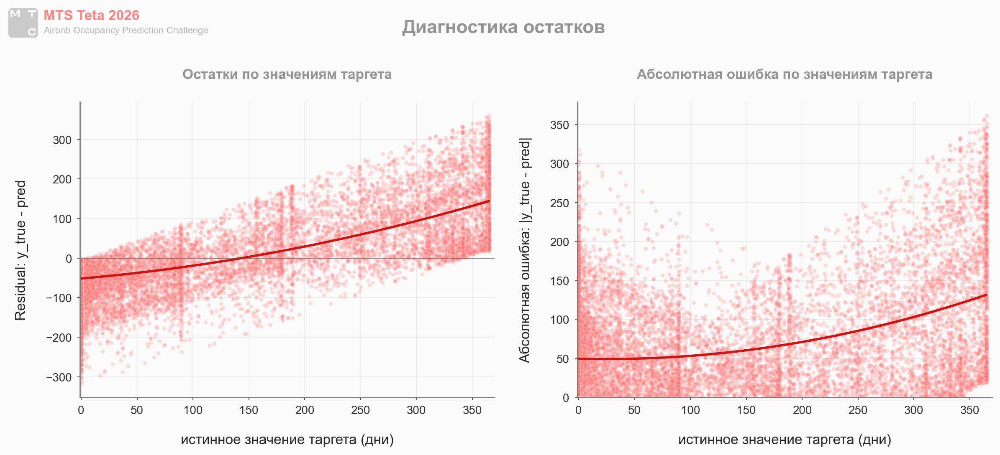

In [393]:
plot_err = df_err.sample(min(len(df_err), 15000), random_state=42)

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), sharex=True)

# остатки: y_true - pred
sns.scatterplot(data=plot_err, x='y_true', y='residual',
    color=box, alpha=0.22, s=12, ax=axes[0],)

sns.regplot(data=plot_err, x='y_true', y='residual',
    scatter=False, order=2, color=dimred, line_kws={'lw': 2}, ax=axes[0],)

axes[0].axhline(0, color='#555555', lw=1, alpha=0.6)
axes[0].set_title('Остатки по значениям таргета', fontsize=12)
axes[0].set_xlabel('истинное значение таргета (дни)')
axes[0].set_ylabel('Residual: y_true - pred')
axes[0].set_xlim(-1, 370)

# абсолютная ошибка: |y_true - pred|
sns.scatterplot(data=plot_err, x='y_true', y='abs_error',
    color=box, alpha=0.22, s=12, ax=axes[1],)

sns.regplot(data=plot_err, x='y_true', y='abs_error',
    scatter=False, order=2, color=dimred, line_kws={'lw': 2}, ax=axes[1],)

axes[1].set_title('Абсолютная ошибка по значениям таргета', fontsize=12)
axes[1].set_xlabel('истинное значение таргета (дни)')
axes[1].set_ylabel('Абсолютная ошибка: |y_true - pred|')
axes[1].set_xlim(-1, 370)
axes[1].set_ylim(bottom=0)


fig.suptitle("Диагностика остатков",
    fontsize=16, fontweight="bold", color="#949494", y=0.96)

add_watermark(fig)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.subplots_adjust(wspace=0.2)
plt.show()


**Слева**: график остатков показывает ту же проблему, что и таблица по бинам: модель завышает низкие значения таргета, для маленьких target residual чаще отрицательный. Для больших target residual становится положительным: модель недооценивает верхний хвост. 

**Справа**: ошибка меньше всего в среднем диапазоне и растет к краям, особенно к верхнему хвосту. То есть большие target не только систематически недооцениваются, но и дают крупную ошибку по модулю.

In [179]:
# регрессионные входы meta-model, которые находятся в одной шкале с target
model_pred_cols = [
    'catboost',
    'catboost_inter',
    'lgbm',
    'rf',
    'rf_inter',
    'et',
    'et_inter',
    'cb_huber_basic',
    'cb_huber_inter',
    'cb_w_high',
    'cb_w_top',
    'cb_w_zero_high',
]

model_pred_cols = [c for c in model_pred_cols if c in oof_matrix_selected.columns]

epistemic_uncertainty = oof_matrix_selected[model_pred_cols].std(axis=1)
abs_error_final = np.abs(y.values - np.clip(oof_meta_final, 0, 365))


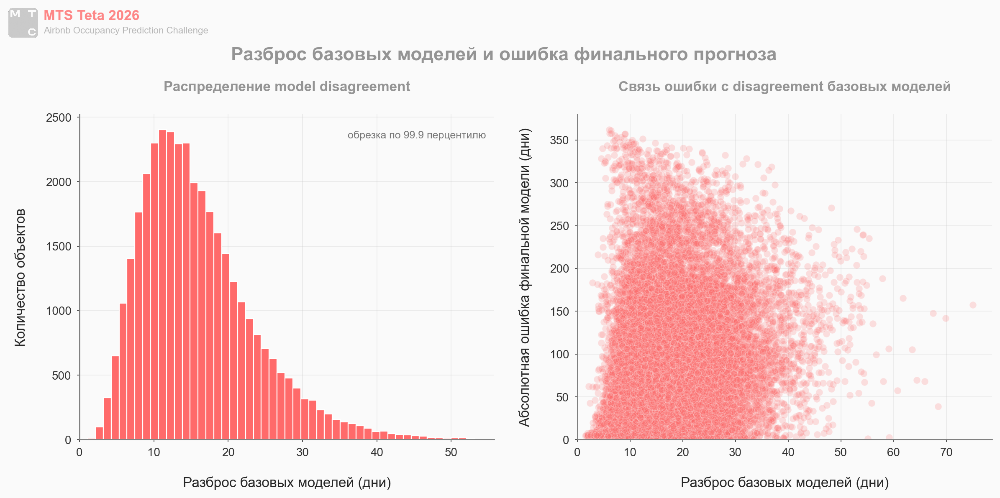

In [394]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# распределение disagreement между базовыми моделями
axes[0].hist(epistemic_uncertainty, bins=50,
    edgecolor='white', range=(0, np.quantile(epistemic_uncertainty, 0.999)),)

axes[0].set_xlim(left=0)
axes[0].set_xlabel("Разброс базовых моделей (дни)")
axes[0].set_ylabel("Количество объектов")
axes[0].set_title("Распределение model disagreement", fontsize=12)

axes[0].text(0.98, 0.95, "обрезка по 99.9 перцентилю",
    transform=axes[0].transAxes,
    ha='right', va='top', fontsize=9, color="#777777",)

# связь disagreement и фактической ошибки
sns.scatterplot(x=epistemic_uncertainty, y=abs_error_final,
    ax=axes[1], alpha=0.2, color=box,)

axes[1].set_xlim(left=0)
axes[1].set_ylim(bottom=0)
axes[1].set_xlabel("Разброс базовых моделей (дни)")
axes[1].set_ylabel("Абсолютная ошибка финальной модели (дни)")
axes[1].set_title("Связь ошибки с disagreement базовых моделей", fontsize=12)

fig.suptitle("Разброс базовых моделей и ошибка финального прогноза",
    fontsize=16, fontweight="bold", color="#949494", y=0.91)

add_watermark(fig)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.subplots_adjust(wspace=0.2)
plt.show()


**Слева**: у большинства объектов базовые модели расходятся в предсказаниях умеренно, примерно на 10-20 дней. Есть длинный правый хвост: для части объектов модели сильно не согласны друг с другом, до 40-50+ дней.

**Справа**: облако очень широкое, при маленьком несогласии моделей ошибка может быть как маленькой, так и очень большой; при большом несогласии ошибка тоже может быть разной, явной надежной зависимости для отдельного объекта нет.

Если базовые модели сильно расходятся, объект чаще оказывается сложным.

---

# Outro: идеи для дальнейшего улучшения


#### Идея №1: искать новый внешний сигнал о качестве и спросе объекта

Текущая модель уже использует сильные сигналы из `_id`, `host_name`, отзывов, цены, географии и lookup-признаков. При этом диагностика ошибок показывает, что модель все еще стягивает прогнозы к середине: низкие значения завышаются, а верхний хвост `300+` недооценивается. Это похоже не только на проблему модели, но и на нехватку информации в исходных признаках.

Что можно сделать:

- найти дополнительные данные об объектах или похожих объявлениях: amenities, число спален, рейтинг, число отзывов, районные рыночные признаки;
- добавить более детальные внешние признаки спроса: плотность гостиниц, туристических мест, метро, деловых зон, сезонных точек притяжения;
- строить агрегаты не просто по району, а по радиусам вокруг объекта и по типу жилья;
- проверять новые признаки отдельной веткой модели и оставлять только те, которые улучшают ошибку на хвостах `0` и `300+`.

#### Идея №2: аккуратнее извлечь структуру из текстовых данных

TF-IDF и keyword-подход по `name` уже проверялись и оказались шумными. Но это не значит, что текст полностью бесполезен. Скорее, в одном коротком поле `name` мало устойчивой структуры. Более перспективный вариант — извлекать текстовый сигнал из более богатых описаний объекта или строить отдельные текстовые ветки, не смешивая их сразу с основным пайплайном.

Что можно сделать:

- если доступны полные описания объявлений, amenities или правила жилья, извлекать признаки уже из них, а не только из `name`;
- использовать структурированные поля вроде числа спален, гостей, кроватей, удобств, рейтинга, политики отмены;
- добавить признаки языка или алфавита названия;
- выделить упоминания районов и туристических мест;
- попробовать transformer-эмбеддинги для `name` / `host_name` или более полного текста, например через компактную sentence-transformer модель;
- тестировать текст не только как набор признаков, но и как отдельную OOF-ветку: отдельный регрессор и отдельный классификатор для нулевого режима;
- добавлять предсказания текстовой ветки в мета-модель только если они улучшают качество на OOF и не усиливают train/test shift;
- оценивать не только общий MSE, но и влияние на near-zero и high-tail сегменты.

#### Идея №3: улучшить архитектуру мета-уровня и затем упростить пайплайн

После ablation видно, что вклад разных веток неравномерен: часть признаков и моделей дает сильный прирост, а часть добавляет небольшой дополнительный выигрыш ценой усложнения. Для соревнования это оправдано, но для реального применения такой пайплайн может быть слишком тяжелым. Перед упрощением можно проверить еще один вариант архитектуры: не только складывать предсказания базовых моделей, но и отдельно моделировать остатки.

Что можно сделать:

- добавить residual-модель: обучить отдельные OOF-модели на ошибках первой мета-модели и передать их предсказания на финальный уровень;
- проверить несколько простых residual-веток: CatBoost, LightGBM, Ridge;
- на финальный уровень передавать не только предсказания базовых моделей, но и часть исходных сильных признаков: `_id` / `host_name` статистики, lookup-признаки, ключевые activity/review/host interactions;
- сравнить вариант “только мета-предсказания” с вариантом “мета-предсказания + сильные исходные признаки + residual-предсказания”;
- после этого собрать упрощенную версию модели только из самых сильных блоков: CatBoost, `_id` / `host_name` статистики, lookup, основные weighted-ветки и лучшие interaction-признаки;
- убрать слабые или нестабильные ветки;
- сравнить потерю MSE с уменьшением сложности;
- отдельно проверить, насколько упрощение влияет на верхний хвост и near-zero объекты;
- выбрать компромиссную версию, если потеря качества небольшая, а пайплайн становится заметно проще.
